In [1]:
#Libraries for Data Manipulation
import numpy as np
import pandas as pd

#Libraries for Graph Plotting
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

#Libraries for Network Analysis
import networkx as nx
from networkx import empty_graph, star_graph

import random

In [2]:
"""
Return m unique elements from seq.
This differs from random.sample which can return repeated
elements if seq holds repeated elements.
Note: rng is a random.Random or numpy.random.RandomState instance.
"""
def random_subset(seq, m, rng):
    # Create an empty set to store the unique elements
    targets = set()

    # Loop until we have m unique elements
    while len(targets) < m:
        # Choose a random element from the sequence
        x = rng.choice(seq)
        # Add the chosen element to the set
        targets.add(x)

    # Return the set of m unique elements
    return targets

In [3]:
"""
Generate a Barabási–Albert preferential attachment graph.
The Barabási–Albert graph is a random graph initialized with `m` nodes.
New nodes are added, each with `m` edges that are preferentially
attached to existing nodes with high degree.
Parameters:
n (int): The number of nodes in the final graph.
m (int): The number of edges to attach from a new node to existing nodes.
seed (int, optional): Seed for the random number generator.
initial_graph (NetworkX graph, optional): The initial graph. If not provided,
a star graph with `m` nodes will be used.
Returns:
NetworkX graph: The generated Barabási–Albert graph.
"""
def barabasi_albert_graph(n, m, seed=None, initial_graph=None):
    # Validate the input parameters
    if m < 1 or m >= n:
        print(f"Barabási–Albert network must have m >= 1 and m < n, m = {m}, n = {n}")

    # Create the initial graph
    G = star_graph(m)

    # Set up the random number generator
    rng = random.Random(seed) if seed is not None else random.Random()

    # Create a list of repeated nodes based on their degree
    repeated_nodes = [n for n, d in G.degree() for _ in range(d)]
    source = len(G)

    # Add new nodes and edges to the graph
    while source < n:
        # Select m unique target nodes using the random_subset function
        targets = random_subset(repeated_nodes, m, rng)
        # Add the new edges to the graph
        G.add_edges_from(zip([source] * m, targets))
        # Update the list of repeated nodes
        repeated_nodes.extend(targets)
        repeated_nodes.extend([source] * m)
        source += 1

    return G

**Barabasi-Albert Network**

In [4]:
S = barabasi_albert_graph(10000, 2, 1)
for edge in S.edges():
    print(edge)

Streaming output truncated to the last 5000 lines.
(2415, 4704)
(2415, 4710)
(2415, 6306)
(2415, 7378)
(2415, 8086)
(2415, 9852)
(2417, 3638)
(2418, 7736)
(2418, 8523)
(2419, 7443)
(2421, 2481)
(2421, 4691)
(2421, 9270)
(2423, 5458)
(2424, 3505)
(2426, 2697)
(2426, 3606)
(2426, 9263)
(2428, 2620)
(2428, 3938)
(2428, 9897)
(2429, 2656)
(2430, 4093)
(2430, 5256)
(2430, 7677)
(2430, 7679)
(2431, 2531)
(2431, 9439)
(2432, 3837)
(2432, 5697)
(2432, 5812)
(2432, 7185)
(2433, 4544)
(2433, 5584)
(2436, 9847)
(2437, 8894)
(2438, 6748)
(2439, 4044)
(2439, 9987)
(2440, 6480)
(2440, 9048)
(2442, 9160)
(2443, 3950)
(2443, 4457)
(2443, 5305)
(2443, 5913)
(2444, 5784)
(2444, 6464)
(2445, 2746)
(2445, 3757)
(2445, 3946)
(2445, 5585)
(2445, 9074)
(2446, 8153)
(2447, 3250)
(2447, 4208)
(2447, 6394)
(2447, 7351)
(2448, 3086)
(2449, 8556)
(2449, 9464)
(2449, 9984)
(2450, 7224)
(2451, 5167)
(2451, 8050)
(2452, 5459)
(2452, 8605)
(2453, 4091)
(2453, 5116)
(2455, 3939)
(2455, 9955)
(2457, 5093)
(2458, 7976)


In [5]:
#Calculating the Degree of Each Node In the Network
degrees = [S.degree(node) for node in S.nodes()]

**Network Statistics**

In [6]:
print('Nodes:', len(S.nodes))
print('Edges:', len(S.edges))
max_degree = max(degrees)
min_degree = min(degrees)
avg_degree = np.mean(degrees)
std_degree = np.std(degrees)

print("Max Degree of a Node:", max_degree)
print("Min Degree of a Node:", min_degree)
print("Average Degree of Nodes:", avg_degree)
print("Standard Deviation of Degree Distribution:", std_degree)

Nodes: 10000
Edges: 19996
Max Degree of a Node: 264
Min Degree of a Node: 2
Average Degree of Nodes: 3.9992
Standard Deviation of Degree Distribution: 6.53397270885026


**Degree Distribution**

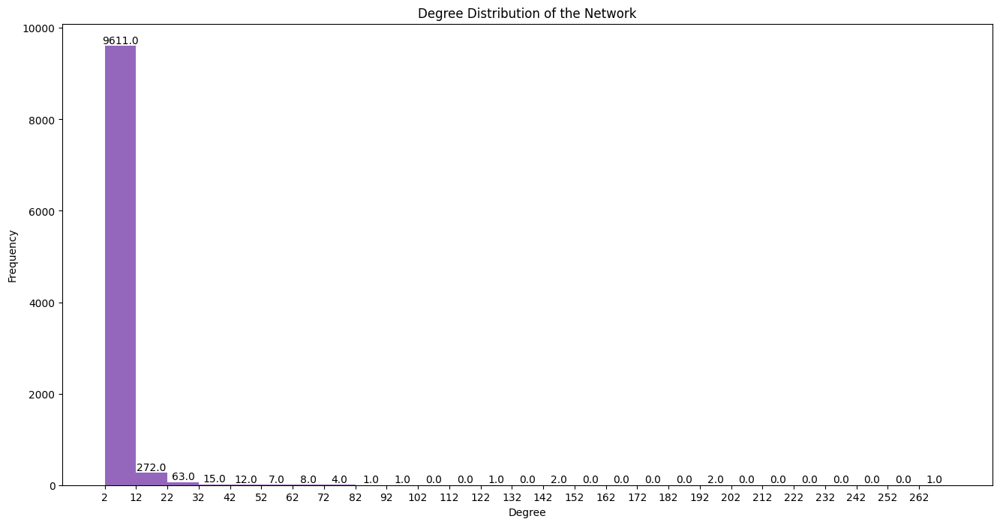

In [12]:
# Define the Bin Size and Bins
bin_size = 10
bins = range(min(degrees), max(degrees) + bin_size, bin_size)

# Create Histogram
plt.figure(figsize=(16, 8))
plt.hist(degrees, bins=bins, alpha=0.7, linewidth=1.5)

# Add Text Labels for Bin
for i, bin_value in enumerate(bins[:-1]):
    plt.text(bin_value + bin_size/2, plt.hist(degrees, bins=bins)[0][i], str(plt.hist(degrees, bins=bins)[0][i]), ha='center', va='bottom')

# Set x-axis tick locations and labels
plt.xticks(range(min(degrees), max(degrees) + 1, bin_size))

# Set labels and title
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of the Network')

# Show plot
plt.show()

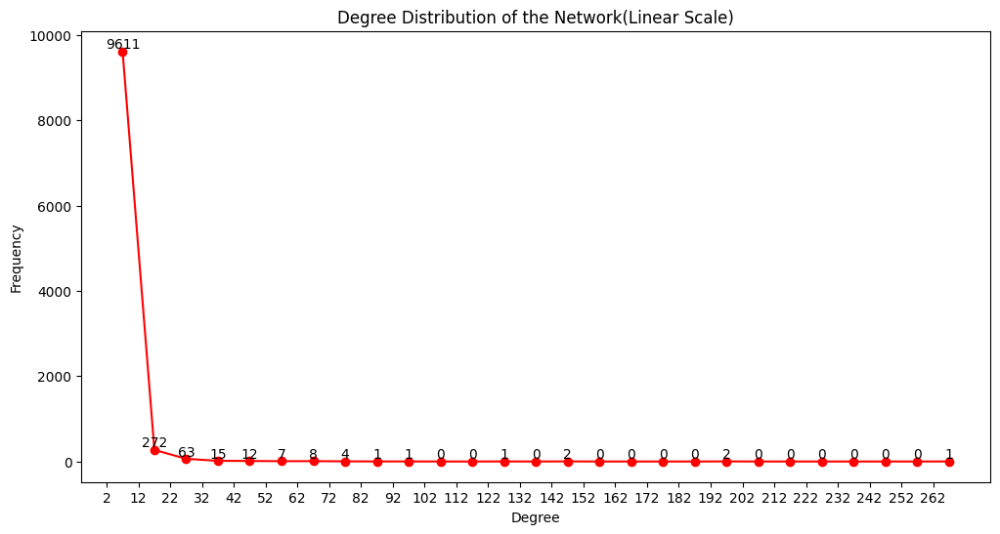

In [ ]:
# Define the desired bin size
bin_size = 10

# Determine the range of degrees and calculate the number of bins
degree_range = max(degrees) - min(degrees)
num_bins = int(degree_range / bin_size) + 1

# Define the bins based on the calculated number of bins
bins = range(min(degrees), max(degrees) + bin_size, bin_size)

# Create Histogram
hist, bins = np.histogram(degrees, bins=bins)

# Calculate the centers of the bins for the line plot
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# Create line plot
plt.figure(figsize=(12, 6))
plt.plot(bin_centers, hist, linestyle='-', marker='o', color='red')

# Add Text Labels for Bin
for i, bin_value in enumerate(bins[:-1]):
    plt.text(bin_value + bin_size / 2, hist[i], str(hist[i]), ha='center', va='bottom')

# Set x-axis tick locations and labels
plt.xticks(range(min(degrees), max(degrees) + 1, bin_size))

# Set labels and title
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of the Network(Linear Scale)')

# Show plot
plt.show()

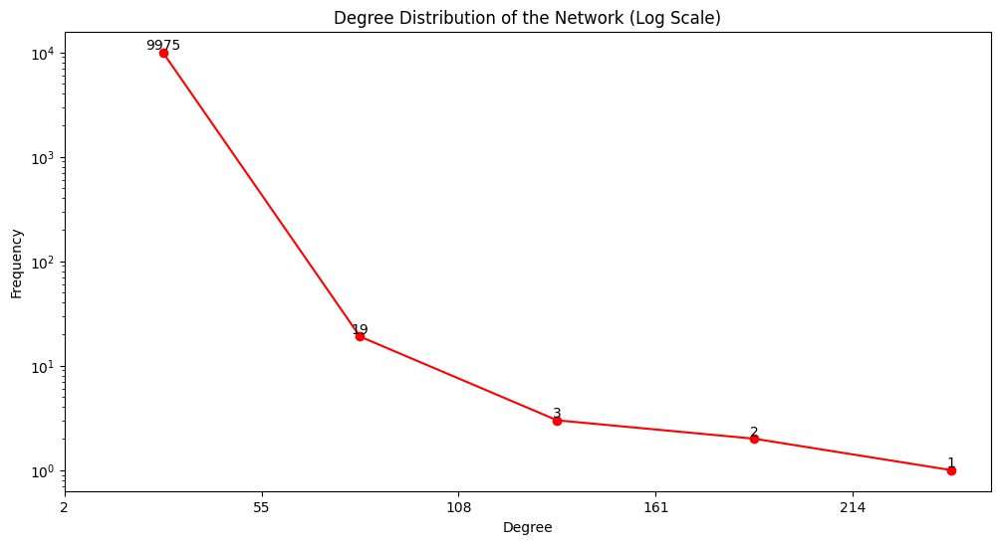

In [ ]:
# Define the desired bin size
bin_size = 53

# Determine the range of degrees and calculate the number of bins
degree_range = max(degrees) - min(degrees)
num_bins = int(degree_range / bin_size) + 1

# Define the bins based on the calculated number of bins
bins = range(min(degrees), max(degrees) + bin_size, bin_size)

# Create Histogram
hist, bins = np.histogram(degrees, bins=bins)

# Calculate the centers of the bins for the line plot
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# Create line plot
plt.figure(figsize=(12, 6))
plt.plot(bin_centers, hist, linestyle='-', marker='o', color='red')

# Add Text Labels for Bin
for i, bin_value in enumerate(bins[:-1]):
    plt.text(bin_value + bin_size / 2, hist[i], str(hist[i]), ha='center', va='bottom')

# Set x-axis tick locations and labels
plt.xticks(range(min(degrees), max(degrees) + 1, bin_size))

# Set y-axis scale to logarithmic
plt.yscale('log')

# Set labels and title
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of the Network (Log Scale)')

# Show plot
plt.show()

**Degree Centrality**

In [ ]:
#Calculate Degree Centrality
deg_centrality = nx.degree_centrality(S)

#Print each node and its Degree Centrality
for node, centrality in deg_centrality.items():
    print(f"Node {node}: Degree Centrality = {centrality}")

Streaming output truncated to the last 5000 lines.
Node 5000: Degree Centrality = 0.00020002000200020003
Node 5001: Degree Centrality = 0.00020002000200020003
Node 5002: Degree Centrality = 0.00040004000400040005
Node 5003: Degree Centrality = 0.00020002000200020003
Node 5004: Degree Centrality = 0.00030003000300030005
Node 5005: Degree Centrality = 0.00040004000400040005
Node 5006: Degree Centrality = 0.00020002000200020003
Node 5007: Degree Centrality = 0.00030003000300030005
Node 5008: Degree Centrality = 0.00020002000200020003
Node 5009: Degree Centrality = 0.00020002000200020003
Node 5010: Degree Centrality = 0.00020002000200020003
Node 5011: Degree Centrality = 0.00030003000300030005
Node 5012: Degree Centrality = 0.00030003000300030005
Node 5013: Degree Centrality = 0.0005000500050005
Node 5014: Degree Centrality = 0.00030003000300030005
Node 5015: Degree Centrality = 0.00020002000200020003
Node 5016: Degree Centrality = 0.00020002000200020003
Node 5017: Degree Centrality = 0.00

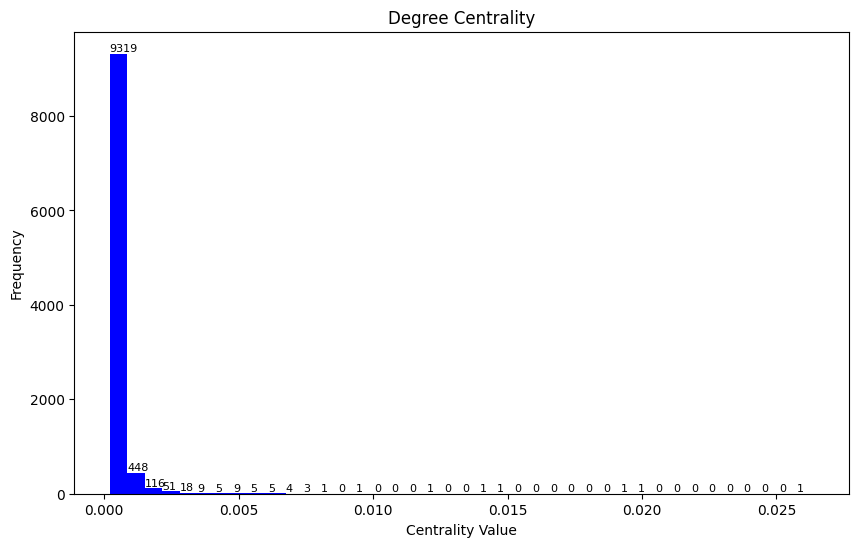

In [ ]:
# Plot distribution of centrality values for Degree Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Degree Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Eignevector Centrality**

In [ ]:
#Calculate Eignevector Centrality
eigenvector_centrality = nx.eigenvector_centrality(S)

#Print each node and its Eignevector Centrality
for node, centrality in eigenvector_centrality.items():
    print(f"Node {node}: Eignevector Centrality = {centrality}")

Streaming output truncated to the last 5000 lines.
Node 5000: Eignevector Centrality = 0.00043507482615505905
Node 5001: Eignevector Centrality = 0.0001925017816085721
Node 5002: Eignevector Centrality = 0.00015716988343555832
Node 5003: Eignevector Centrality = 0.00038486026228111414
Node 5004: Eignevector Centrality = 0.0021658212748049185
Node 5005: Eignevector Centrality = 0.0006024357897211903
Node 5006: Eignevector Centrality = 0.00043133846399710384
Node 5007: Eignevector Centrality = 4.801031771359279e-05
Node 5008: Eignevector Centrality = 0.03571382365375614
Node 5009: Eignevector Centrality = 6.628753530416591e-05
Node 5010: Eignevector Centrality = 0.0021320546630369734
Node 5011: Eignevector Centrality = 0.001974936170466008
Node 5012: Eignevector Centrality = 0.00029358548659663816
Node 5013: Eignevector Centrality = 0.0007928227765068387
Node 5014: Eignevector Centrality = 0.0001651298572754835
Node 5015: Eignevector Centrality = 0.0007027788021242202
Node 5016: Eignevec

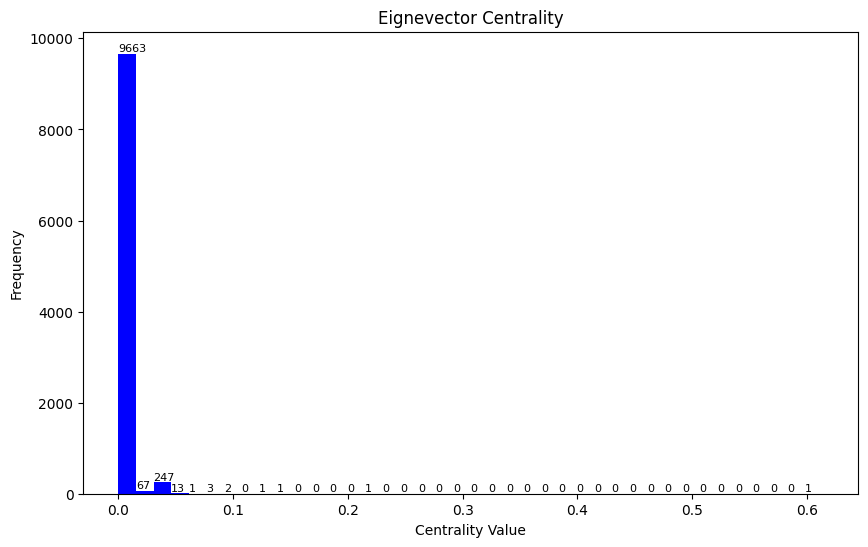

In [ ]:
# Plot distribution of centrality values for Eignevector Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Eignevector Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Katz Centrality**

In [ ]:
katz_centrality = nx.katz_centrality_numpy(S, alpha=0.1, beta=1.0, normalized=True, weight=None)

# Print each node and its Katz Centrality
for node, centrality in katz_centrality.items():
    print(f"Node {node}: Katz Centrality = {centrality}")

Streaming output truncated to the last 5000 lines.
Node 5000: Katz Centrality = 0.000942663231718456
Node 5001: Katz Centrality = 0.00256301346437542
Node 5002: Katz Centrality = 0.0032176152658934245
Node 5003: Katz Centrality = 0.004546785017225804
Node 5004: Katz Centrality = 0.0023747173570810667
Node 5005: Katz Centrality = 0.0067064319273381166
Node 5006: Katz Centrality = 0.002784554266752095
Node 5007: Katz Centrality = 0.003124292072876162
Node 5008: Katz Centrality = 0.0013756408951525732
Node 5009: Katz Centrality = 0.0029576383772150277
Node 5010: Katz Centrality = 0.002766649572685852
Node 5011: Katz Centrality = 0.004212008535844623
Node 5012: Katz Centrality = 0.001702616666719417
Node 5013: Katz Centrality = 0.0034946567003509223
Node 5014: Katz Centrality = 0.003411971374496492
Node 5015: Katz Centrality = 0.002987421411511818
Node 5016: Katz Centrality = 0.0032450370363048147
Node 5017: Katz Centrality = 0.021120542553833162
Node 5018: Katz Centrality = 0.003184581503

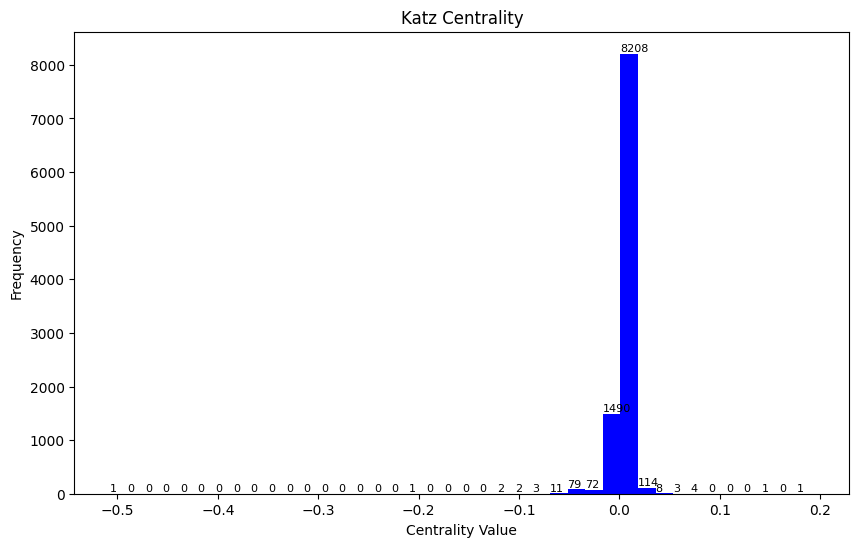

In [ ]:
# Plot distribution of centrality values for Katz Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Katz Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Page Rank**

In [ ]:
pr = nx.pagerank(S, alpha=0.8)

# Print each node and its Page Rank
for node, centrality in pr.items():
    print(f"Node {node}: Page Rank  = {centrality}")

Streaming output truncated to the last 5000 lines.
Node 5000: Page Rank  = 5.751575029925181e-05
Node 5001: Page Rank  = 6.240017250849101e-05
Node 5002: Page Rank  = 0.00010848761107561103
Node 5003: Page Rank  = 5.5605737793704854e-05
Node 5004: Page Rank  = 7.891159701876176e-05
Node 5005: Page Rank  = 0.00010163392715470388
Node 5006: Page Rank  = 5.54227995263015e-05
Node 5007: Page Rank  = 8.49041947410604e-05
Node 5008: Page Rank  = 5.366733303867616e-05
Node 5009: Page Rank  = 5.723665013731305e-05
Node 5010: Page Rank  = 5.9370382685505364e-05
Node 5011: Page Rank  = 8.114899232793336e-05
Node 5012: Page Rank  = 8.431723294068262e-05
Node 5013: Page Rank  = 0.00012821471011286258
Node 5014: Page Rank  = 7.90499326670211e-05
Node 5015: Page Rank  = 5.641382339300836e-05
Node 5016: Page Rank  = 5.7557286302632865e-05
Node 5017: Page Rank  = 5.5361333753033254e-05
Node 5018: Page Rank  = 5.575981880102174e-05
Node 5019: Page Rank  = 0.00010741378222188793
Node 5020: Page Rank  = 

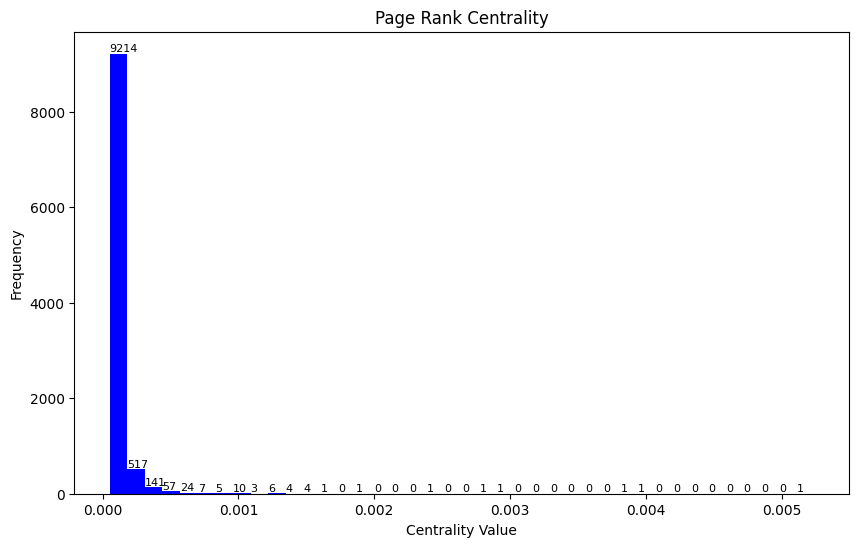

In [ ]:
# Plot distribution of centrality values for Page Rank Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Page Rank Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Clustering Coefficient**

In [ ]:
#Calculate Local Clustering Coefficient
local_clustering_coefficient = nx.clustering(S)

#Print each node and it's Clustering Coefficient
for node, local in local_clustering_coefficient.items():
    print(f"Node {node}: Local Clustering Coefficient = {local}")

Streaming output truncated to the last 5000 lines.
Node 5000: Local Clustering Coefficient = 0
Node 5001: Local Clustering Coefficient = 0
Node 5002: Local Clustering Coefficient = 0
Node 5003: Local Clustering Coefficient = 0
Node 5004: Local Clustering Coefficient = 0
Node 5005: Local Clustering Coefficient = 0
Node 5006: Local Clustering Coefficient = 0
Node 5007: Local Clustering Coefficient = 0
Node 5008: Local Clustering Coefficient = 0
Node 5009: Local Clustering Coefficient = 0
Node 5010: Local Clustering Coefficient = 0
Node 5011: Local Clustering Coefficient = 0
Node 5012: Local Clustering Coefficient = 0
Node 5013: Local Clustering Coefficient = 0
Node 5014: Local Clustering Coefficient = 0
Node 5015: Local Clustering Coefficient = 0
Node 5016: Local Clustering Coefficient = 0
Node 5017: Local Clustering Coefficient = 0
Node 5018: Local Clustering Coefficient = 0
Node 5019: Local Clustering Coefficient = 0
Node 5020: Local Clustering Coefficient = 0
Node 5021: Local Clusteri

In [ ]:
#Calculate Average Local Clustering Coefficient
average_local_clustering_coefficient = nx.average_clustering(S)

print("Average Local Clustering Coefficient:", average_local_clustering_coefficient)

Average Local Clustering Coefficient: 0.0044780905036862426


In [ ]:
#Calculate Global Clustering Coefficient
global_clustering_coefficient = nx.transitivity(S)

#Print Global Clustering Coefficient
print("Global Clustering Coefficient:", global_clustering_coefficient)

Global Clustering Coefficient: 0.001404350561008792


In [ ]:
top_10_nodes = sorted(local_clustering_coefficient.items(), key=lambda x: x[1], reverse=True)[:10]
nodes_with_coefficient_1 = sum(1 for coeff in local_clustering_coefficient.values() if coeff == 1)
print(f"Number of Nodes with Local Clustering Coefficient 1: {nodes_with_coefficient_1}")

Number of Nodes with Local Clustering Coefficient 1: 34


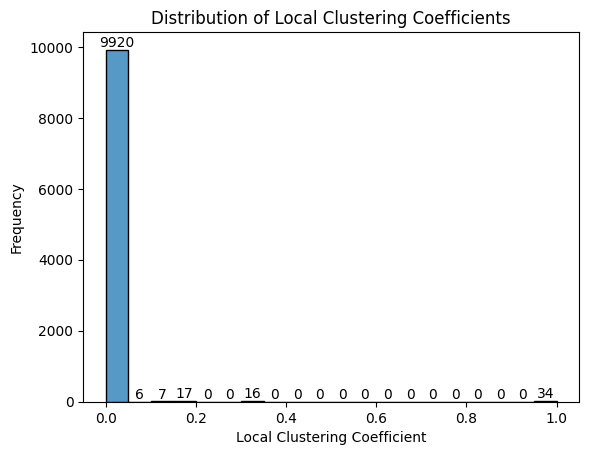

In [ ]:
#Create a line chart for the distribution of local clustering coefficients
coefficients = list(local_clustering_coefficient.values())
coefficients.sort()
unique_coefficients = list(set(coefficients))
counts = [coefficients.count(coeff) for coeff in unique_coefficients]

#Create a histogram for the distribution of local clustering coefficients
sns.histplot(list(local_clustering_coefficient.values()), bins=20, kde=False)
plt.xlabel('Local Clustering Coefficient')
plt.ylabel('Frequency')
plt.title('Distribution of Local Clustering Coefficients')

#Display the frequency count on top of each bin
for p in plt.gca().patches:
    plt.gca().annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='bottom', color='black', fontsize=10)

plt.show()

**Betweenness Centrality**

In [ ]:
bet_centrality = nx.betweenness_centrality(S, normalized = True,endpoints = False)

#Print each node and its Betweenness Centrality (excluding nodes with centrality = 0)
for node, centrality in bet_centrality.items():
    if centrality != 0:
        print(f"Node {node}: Betweenness Centrality = {centrality}")

Streaming output truncated to the last 5000 lines.
Node 4982: Betweenness Centrality = 1.2696849510056741e-05
Node 4983: Betweenness Centrality = 0.00010358999512529643
Node 4984: Betweenness Centrality = 0.00011249054120810648
Node 4985: Betweenness Centrality = 0.00011806458932767768
Node 4986: Betweenness Centrality = 8.772877171719156e-05
Node 4987: Betweenness Centrality = 4.122588744854753e-06
Node 4988: Betweenness Centrality = 0.00041961753219874477
Node 4989: Betweenness Centrality = 0.000121149095003782
Node 4990: Betweenness Centrality = 3.8297082531493835e-05
Node 4991: Betweenness Centrality = 7.079466494934065e-05
Node 4992: Betweenness Centrality = 5.601967807728227e-05
Node 4993: Betweenness Centrality = 4.056850266121552e-06
Node 4994: Betweenness Centrality = 0.0001759735306853539
Node 4995: Betweenness Centrality = 1.3346626833572618e-05
Node 4996: Betweenness Centrality = 1.984049986436763e-05
Node 4997: Betweenness Centrality = 5.162043845825605e-05
Node 4998: Betw

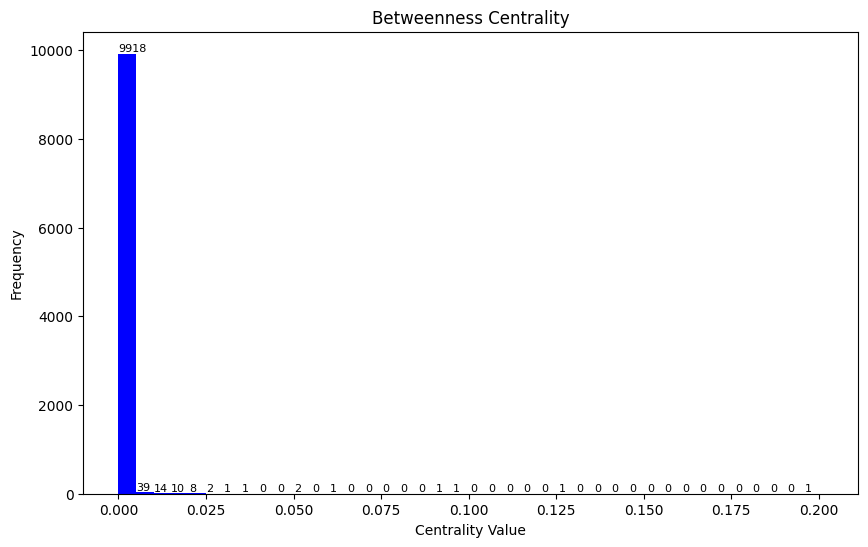

In [ ]:
# Plot distribution of centrality values for Betweenness Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Betweenness Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Closeness centrality**

In [ ]:
#Calculate Closeness centrality
close_centrality = nx.closeness_centrality(S)

#Print each node and its Closeness centrality
for node, centrality in close_centrality.items():
    print(f"Node {node}: Closeness centrality = {centrality}")

Streaming output truncated to the last 5000 lines.
Node 5000: Closeness centrality = 0.19211481929794225
Node 5001: Closeness centrality = 0.1795636167729191
Node 5002: Closeness centrality = 0.17771260997067448
Node 5003: Closeness centrality = 0.19498829953198127
Node 5004: Closeness centrality = 0.20454545454545456
Node 5005: Closeness centrality = 0.20274544790948537
Node 5006: Closeness centrality = 0.19038461538461537
Node 5007: Closeness centrality = 0.17441130298273155
Node 5008: Closeness centrality = 0.2494635996207774
Node 5009: Closeness centrality = 0.17834974315068494
Node 5010: Closeness centrality = 0.20404040404040405
Node 5011: Closeness centrality = 0.21295310303701495
Node 5012: Closeness centrality = 0.18552052989962337
Node 5013: Closeness centrality = 0.19917929921714708
Node 5014: Closeness centrality = 0.18432695498285587
Node 5015: Closeness centrality = 0.19790986283474854
Node 5016: Closeness centrality = 0.1994057115507339
Node 5017: Closeness centrality = 

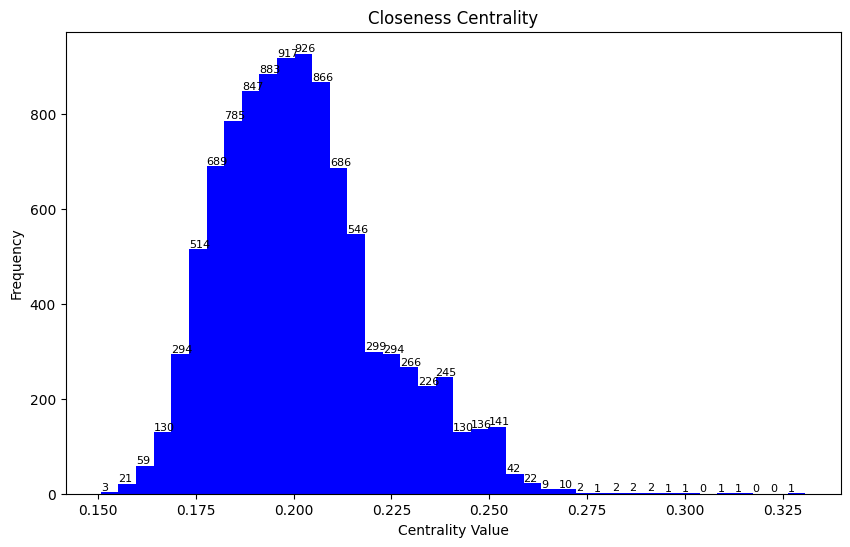

In [ ]:
# Plot distribution of centrality values for Closeness Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Closeness Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Reciprocity and Transitivity**

In [ ]:
reciprocity = nx.reciprocity(S)
print("Reciprocity:", reciprocity)

Reciprocity: 0.0


In [ ]:
transitivity = nx.transitivity(S)
print("Transitivity:", transitivity)

Transitivity: 0.001404350561008792


**Top 10 Nodes**

In [ ]:
df_degree = pd.DataFrame(list(deg_centrality.items()), columns=['Node', 'Degree Centrality']).nlargest(10, 'Degree Centrality')
df_eigenvector = pd.DataFrame(list(eigenvector_centrality.items()), columns=['Node', 'Eigenvector Centrality']).nlargest(10, 'Eigenvector Centrality')
df_katz = pd.DataFrame(list(katz_centrality.items()), columns=['Node', 'Katz Centrality']).nlargest(10, 'Katz Centrality')
df_pagerank = pd.DataFrame(list(pr.items()), columns=['Node', 'PageRank Centrality']).nlargest(10, 'PageRank Centrality')
df_betweenness = pd.DataFrame(list(bet_centrality.items()), columns=['Node', 'Betweenness Centrality']).nlargest(10, 'Betweenness Centrality')
df_closeness = pd.DataFrame(list(close_centrality.items()), columns=['Node', 'Closeness Centrality']).nlargest(10, 'Closeness Centrality')

In [ ]:
#Print Top 10
print("\nTop 10 nodes by Degree Centrality:")
print(df_degree.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Eigenvector Centrality:")
print(df_eigenvector.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Katz Centrality:")
print(df_katz.to_string(index=False, justify='center'))

print("\nTop 10 nodes by PageRank Centrality:")
print(df_pagerank.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Betweenness Centrality:")
print(df_betweenness.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Closeness Centrality:")
print(df_closeness.to_string(index=False, justify='center'))


Top 10 nodes by Degree Centrality:
 Node  Degree Centrality
   3       0.026403     
   0       0.020002     
  25       0.019402     
   5       0.015102     
   8       0.014501     
  27       0.012201     
  12       0.009701     
  28       0.008201     
  34       0.007901     
 101       0.007801     

Top 10 nodes by Eigenvector Centrality:
 Node  Eigenvector Centrality
   3          0.613823       
   0          0.222667       
   5          0.144317       
   8          0.131763       
  25          0.101004       
  12          0.094033       
   4          0.082203       
   1          0.079836       
  11          0.077949       
  77          0.063652       

Top 10 nodes by Katz Centrality:
 Node  Katz Centrality
  34      0.193930    
  11      0.149827    
  33      0.087218    
  58      0.086793    
  32      0.084070    
 101      0.080841    
  44      0.065915    
 221      0.060786    
  88      0.059829    
  20      0.043569    

Top 10 nodes by PageRank Centr

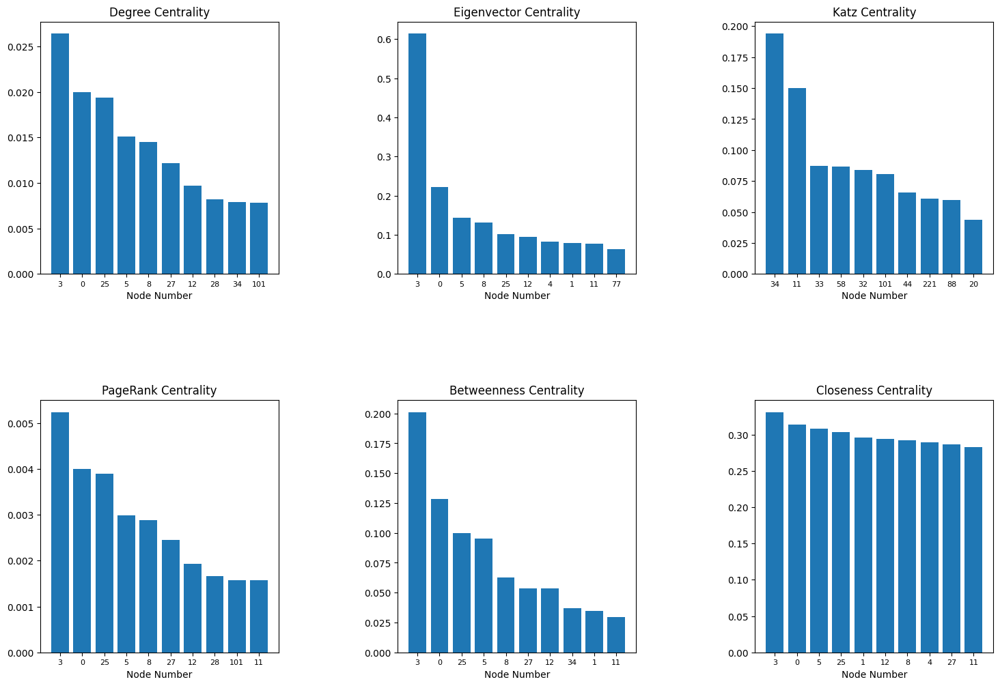

In [ ]:
plt.figure(figsize=(18, 12))

# Subplot 1
plt.subplot(2, 3, 1)
plt.bar(range(len(df_degree)), df_degree['Degree Centrality'])
plt.title('Degree Centrality')
plt.xticks(range(len(df_degree)), df_degree['Node'], rotation=0, fontsize=8)
plt.xlabel("Node Number")

# Subplot 2
plt.subplot(2, 3, 2)
plt.bar(range(len(df_eigenvector)), df_eigenvector['Eigenvector Centrality'])
plt.title('Eigenvector Centrality')
plt.xticks(range(len(df_eigenvector)), df_eigenvector['Node'], rotation=0, fontsize=8)
plt.xlabel("Node Number")

# Subplot 3
plt.subplot(2, 3, 3)
plt.bar(range(len(df_katz)), df_katz['Katz Centrality'])
plt.title('Katz Centrality')
plt.xticks(range(len(df_katz)), df_katz['Node'], rotation=0, fontsize=8)
plt.xlabel("Node Number")

# Subplot 4
plt.subplot(2, 3, 4)
plt.bar(range(len(df_pagerank)), df_pagerank['PageRank Centrality'])
plt.title('PageRank Centrality')
plt.xticks(range(len(df_pagerank)), df_pagerank['Node'], rotation=0, fontsize=8)
plt.xlabel("Node Number")

# Subplot 5
plt.subplot(2, 3, 5)
plt.bar(range(len(df_betweenness)), df_betweenness['Betweenness Centrality'])
plt.title('Betweenness Centrality')
plt.xticks(range(len(df_betweenness)), df_betweenness['Node'], rotation=0, fontsize=8)
plt.xlabel("Node Number")

# Subplot 6
plt.subplot(2, 3, 6)
plt.bar(range(len(df_closeness)), df_closeness['Closeness Centrality'])
plt.title('Closeness Centrality')
plt.xticks(range(len(df_closeness)), df_closeness['Node'], rotation=0, fontsize=8)
plt.xlabel("Node Number")

plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()

**Visualizing Centrality**

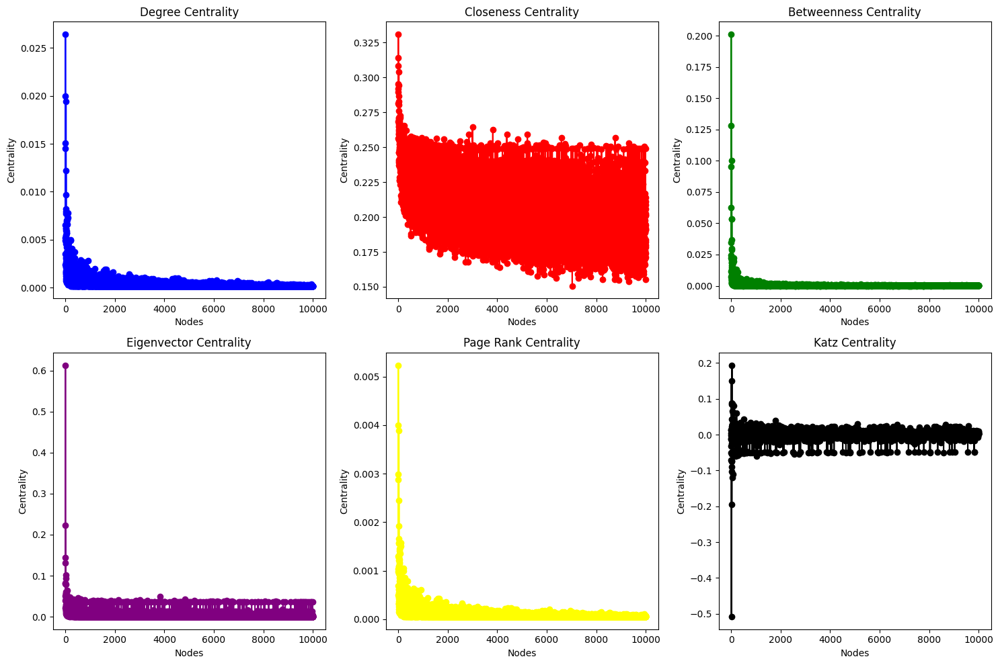

In [ ]:
nodes = list(S.nodes())
degree_values = [deg_centrality[node] for node in nodes]
closeness_values = [close_centrality[node] for node in nodes]
betweenness_values = [bet_centrality[node] for node in nodes]
eigenvector_values = [eigenvector_centrality[node] for node in nodes]
page_rank = [pr[node] for node in nodes]
katz_values = [katz_centrality[node] for node in nodes]

#Plot centrality measures
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.plot(nodes, degree_values, marker='o', linestyle='-', color='b')
plt.title('Degree Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 2)
plt.plot(nodes, closeness_values, marker='o', linestyle='-', color='r')
plt.title('Closeness Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 3)
plt.plot(nodes, betweenness_values, marker='o', linestyle='-', color='g')
plt.title('Betweenness Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 4)
plt.plot(nodes, eigenvector_values, marker='o', linestyle='-', color='purple')
plt.title('Eigenvector Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 5)
plt.plot(nodes, page_rank, marker='o', linestyle='-', color='yellow')
plt.title('Page Rank Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 6)
plt.plot(nodes, katz_values, marker='o', linestyle='-', color='black')
plt.title('Katz Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.tight_layout()
plt.show()

**Correlation Matrix**

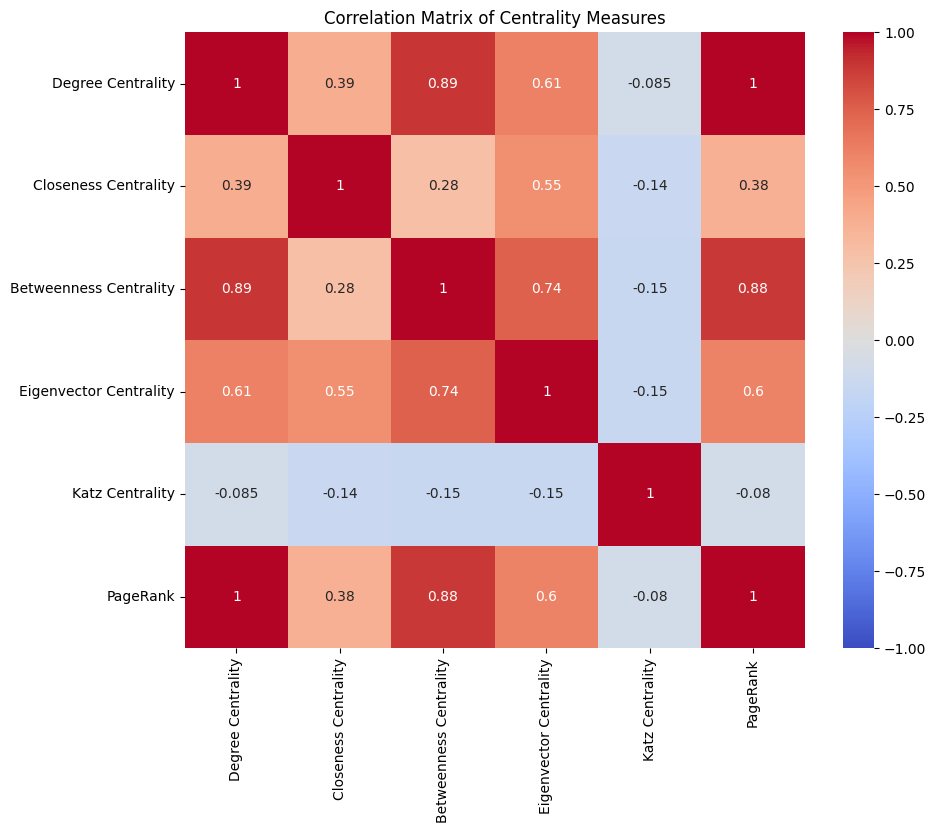

In [ ]:
data = {
    "Degree Centrality": list(deg_centrality.values()),
    "Closeness Centrality": list(close_centrality.values()),
    "Betweenness Centrality": list(bet_centrality.values()),
    "Eigenvector Centrality": list(eigenvector_centrality.values()),
    "Katz Centrality": list(katz_centrality.values()),
    "PageRank": list(pr.values())
}
df = pd.DataFrame(data)

# Calculate correlation matrix
correlation_matrix = df.corr()

# Plot correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Matrix of Centrality Measures")
plt.show()


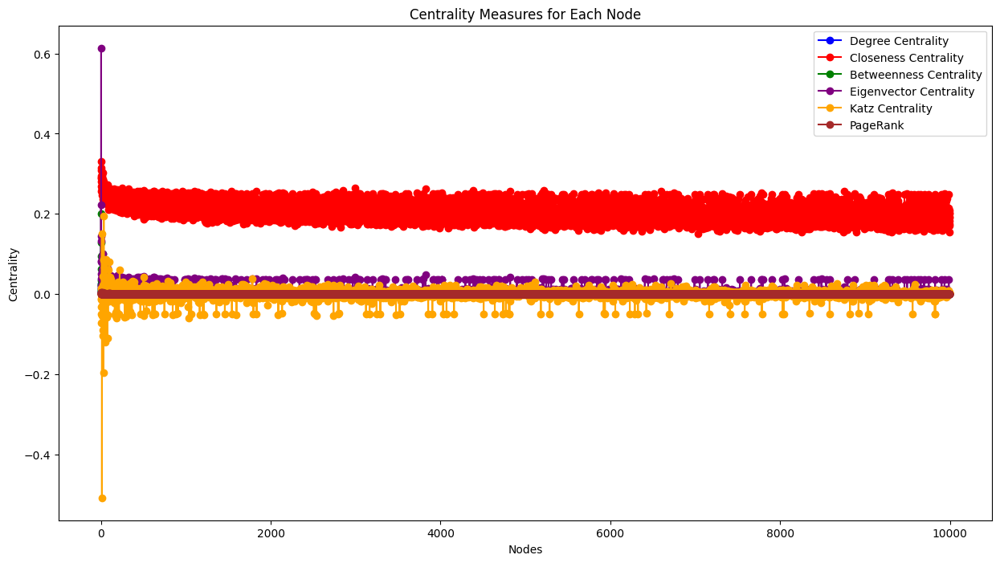

In [ ]:
# Plot centrality measures
plt.figure(figsize=(15, 8))

plt.plot(nodes, degree_values, marker='o', linestyle='-', color='b', label='Degree Centrality')
plt.plot(nodes, closeness_values, marker='o', linestyle='-', color='r', label='Closeness Centrality')
plt.plot(nodes, betweenness_values, marker='o', linestyle='-', color='g', label='Betweenness Centrality')
plt.plot(nodes, eigenvector_values, marker='o', linestyle='-', color='purple', label='Eigenvector Centrality')
plt.plot(nodes, katz_values, marker='o', linestyle='-', color='orange', label='Katz Centrality')
plt.plot(nodes, page_rank, marker='o', linestyle='-', color='brown', label='PageRank')

plt.title('Centrality Measures for Each Node')
plt.xlabel('Nodes')
plt.ylabel('Centrality')
plt.legend()
plt.grid(False)
plt.show()

In [ ]:
mean_degree = sum(deg_centrality.values()) / len(deg_centrality)
mean_closeness = sum(close_centrality.values()) / len(close_centrality)
mean_betweenness = sum(bet_centrality.values()) / len(bet_centrality)
mean_eigenvector = sum(eigenvector_centrality.values()) / len(eigenvector_centrality)
mean_katz = sum(katz_centrality.values()) / len(katz_centrality)
mean_pagerank = sum(pr.values()) / len(pr)

print("Mean Degree Centrality:", mean_degree)
print("Mean Closeness Centrality:", mean_closeness)
print("Mean Betweenness Centrality:", mean_betweenness)
print("Mean Eigenvector Centrality:", mean_eigenvector)
print("Mean Katz Centrality:", mean_katz)
print("Mean PageRank:", mean_pagerank)

Mean Degree Centrality: 0.0003999599959995153
Mean Closeness Centrality: 0.2017425269891805
Mean Betweenness Centrality: 0.00040068476141472977
Mean Eigenvector Centrality: 0.0028938832681988376
Mean Katz Centrality: 0.002261888894395424
Mean PageRank: 0.00010000000000000032


**largest connected component**

Number of nodes in the largest connected component: 10000
Number of edges in the largest connected component: 19996


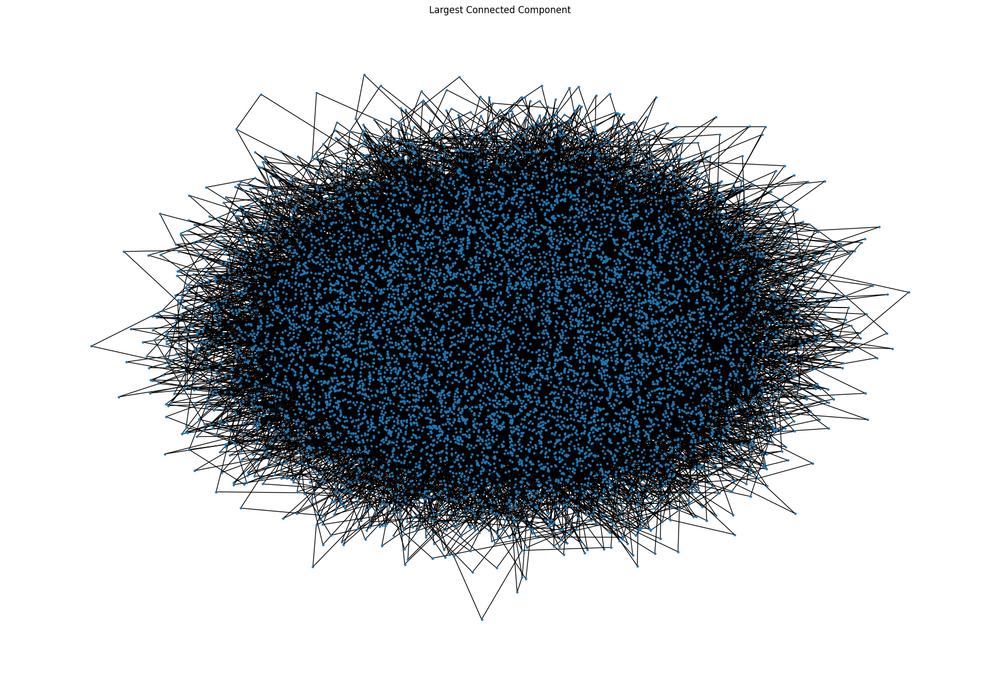

In [ ]:
#Find the largest connected component
largest_component = max(nx.connected_components(S), key=len)

#Create a subgraph of the largest connected component
largest_component_subgraph = S.subgraph(largest_component)

#Print the number of nodes and edges in the largest connected component
print("Number of nodes in the largest connected component:", largest_component_subgraph.number_of_nodes())
print("Number of edges in the largest connected component:", largest_component_subgraph.number_of_edges())

#Visualize the largest connected component
plt.figure(figsize=(18, 12))
nx.draw(largest_component_subgraph, with_labels=False, node_size = 5)
plt.title('Largest Connected Component')
plt.show()

**Idependent Cascade Model**

In [ ]:
def initialize_activation_probabilities(G):
    for node in G.nodes():
        neighbors = list(G.neighbors(node))
        total_prob = 1.0
        G.nodes[node]['activation_probability'] = {}
        for neighbor in neighbors:
            p = random.uniform(0, total_prob)
            G.nodes[node]['activation_probability'][neighbor] = p
            total_prob -= p

def independent_cascade_model(G, initial_nodes):
    activated_nodes = set(initial_nodes)
    new_nodes_activated = True
    max_steps = 0

    while new_nodes_activated:
        new_nodes_activated = False
        new_activated_nodes = set()

        for node in activated_nodes:
            neighbors = list(G.neighbors(node))

            for neighbor in neighbors:
                if neighbor not in activated_nodes:
                    activation_probability = G.nodes[node]['activation_probability'][neighbor]
                    if random.random() < activation_probability:
                        new_activated_nodes.add(neighbor)
                        new_nodes_activated = True

        activated_nodes |= new_activated_nodes
        max_steps += 1

    return len(activated_nodes), max_steps

In [ ]:
num_iterations = 10
total_steps = 0
for _ in range(num_iterations):
    start_nodes = random.sample(list(S.nodes()), 2)
    initial_nodes = start_nodes
    initialize_activation_probabilities(S)
    activated_nodes, max_steps = independent_cascade_model(S, initial_nodes)
    total_steps += max_steps
    print("Start Nodes:", start_nodes)
    print("Activated Nodes:", activated_nodes)
    print("Max Steps:", max_steps)
    print("-------------------------")

average_steps = total_steps / num_iterations
print("Average number of steps required:", average_steps)

Start Nodes: [5536, 5088]
Activated Nodes: 7898
Max Steps: 263
-------------------------
Start Nodes: [7110, 6045]
Activated Nodes: 7983
Max Steps: 280
-------------------------
Start Nodes: [2694, 8025]
Activated Nodes: 8127
Max Steps: 302
-------------------------
Start Nodes: [3013, 2053]
Activated Nodes: 8087
Max Steps: 304
-------------------------
Start Nodes: [5809, 4941]
Activated Nodes: 7686
Max Steps: 243
-------------------------
Start Nodes: [4458, 5174]
Activated Nodes: 7946
Max Steps: 258
-------------------------
Start Nodes: [3783, 9618]
Activated Nodes: 7549
Max Steps: 196
-------------------------
Start Nodes: [9952, 2943]
Activated Nodes: 8126
Max Steps: 331
-------------------------
Start Nodes: [9409, 6734]
Activated Nodes: 8029
Max Steps: 298
-------------------------
Start Nodes: [8224, 2055]
Activated Nodes: 7958
Max Steps: 288
-------------------------
Average number of steps required: 276.3


**Dataset 1: General Relativity and Quantum Cosmology collaboration network**

In [13]:
#Importing the Dataset -> General Relativity and Quantum Cosmology collaboration network from "https://snap.stanford.edu/data/"
PATH = "/content/CA-GrQc.txt"
G = nx.read_edgelist(PATH)

In [14]:
#Calculating the Degree of Each Node In the Network
degrees = [G.degree(node) for node in G.nodes()]

**Network Statistics**

In [15]:
print('Nodes:', len(G.nodes))
print('Edges:', len(G.edges))
max_degree = max(degrees)
min_degree = min(degrees)
avg_degree = np.mean(degrees)
std_degree = np.std(degrees)

print("Max Degree of a Node:", max_degree)
print("Min Degree of a Node:", min_degree)
print("Average Degree of Nodes:", avg_degree)
print("Standard Deviation of Degree Distribution:", std_degree)

Nodes: 5242
Edges: 14496
Max Degree of a Node: 81
Min Degree of a Node: 1
Average Degree of Nodes: 5.530713468141931
Standard Deviation of Degree Distribution: 7.918407301678446


**Degree Distribution of the Network**



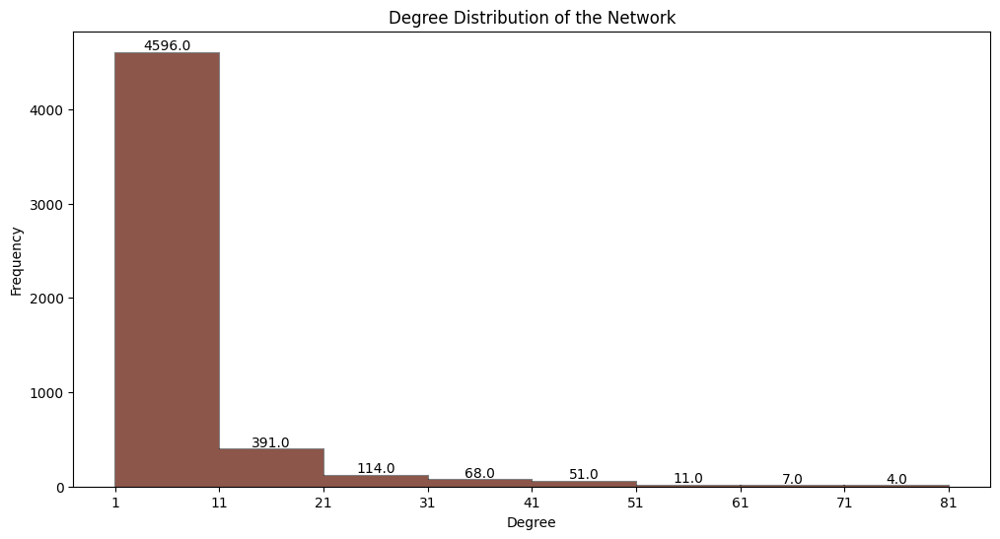

In [16]:
#Define the Bin Size and Bins
bin_size = 10
bins = range(min(degrees), max(degrees) + bin_size, bin_size)

#Create Histogram
plt.figure(figsize=(12, 6))
plt.hist(degrees, bins=bins, alpha=0.5, color='blue', edgecolor='black', linewidth=1.5)

#Add Text Labels for Bin
for i, bin_value in enumerate(bins[:-1]):
    plt.text(bin_value + bin_size/2, plt.hist(degrees, bins=bins)[0][i], str(plt.hist(degrees, bins=bins)[0][i]), ha='center', va='bottom')

#Set x-axis tick locations and labels
plt.xticks(range(min(degrees), max(degrees)+10, 10))

#Set labels and title
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of the Network')

#Show plot
plt.show()

In [ ]:
num_iterations = 10
total_steps = 0

def initialize_activation_probabilities(G):
    for node in G.nodes():
        neighbors = list(G.neighbors(node))
        total_prob = 1.0
        G.nodes[node]['activation_probability'] = {}
        for neighbor in neighbors:
            if neighbor not in G.nodes():
                neighbor = random.choice(list(G.nodes()))
            p = random.uniform(0, total_prob)
            G.nodes[node]['activation_probability'][neighbor] = p
            total_prob -= p

def independent_cascade_model(G, initial_nodes):
    activated_nodes = set(initial_nodes)
    new_nodes_activated = True
    max_steps = 0

    while new_nodes_activated:
        new_nodes_activated = False
        new_activated_nodes = set()

        for node in activated_nodes:
            neighbors = list(G.neighbors(node))

            for neighbor in neighbors:
                if neighbor not in activated_nodes:
                    activation_probability = G.nodes[node]['activation_probability'].get(neighbor, 0)
                    if random.random() < activation_probability:
                        new_activated_nodes.add(neighbor)
                        new_nodes_activated = True

        activated_nodes |= new_activated_nodes
        max_steps += 1

    return len(activated_nodes), max_steps

In [ ]:
for _ in range(num_iterations):
    start_nodes = random.sample(list(G.nodes()), 2)
    initial_nodes = start_nodes
    initialize_activation_probabilities(G)
    activated_nodes, max_steps = independent_cascade_model(G, initial_nodes)
    total_steps += max_steps
    print("Start Nodes:", start_nodes)
    print("Activated Nodes:", activated_nodes)
    print("Max Steps:", max_steps)
    print("-------------------------")

average_steps = total_steps / num_iterations
print("Average number of steps required:", average_steps)

Start Nodes: ['15962', '12788']
Activated Nodes: 2570
Max Steps: 205
-------------------------
Start Nodes: ['19442', '1910']
Activated Nodes: 12
Max Steps: 6
-------------------------
Start Nodes: ['14009', '9915']
Activated Nodes: 2493
Max Steps: 201
-------------------------
Start Nodes: ['24340', '18648']
Activated Nodes: 2370
Max Steps: 179
-------------------------
Start Nodes: ['2410', '1254']
Activated Nodes: 2
Max Steps: 1
-------------------------
Start Nodes: ['14638', '24942']
Activated Nodes: 2523
Max Steps: 192
-------------------------
Start Nodes: ['16765', '17992']
Activated Nodes: 2601
Max Steps: 241
-------------------------
Start Nodes: ['11114', '22605']
Activated Nodes: 3
Max Steps: 2
-------------------------
Start Nodes: ['21861', '19510']
Activated Nodes: 9
Max Steps: 5
-------------------------
Start Nodes: ['23248', '20435']
Activated Nodes: 2307
Max Steps: 139
-------------------------
Average number of steps required: 234.6


**Degree Centrality**

In [ ]:
#Calculate Degree Centrality
deg_centrality = nx.degree_centrality(G)

#Print each node and its Degree Centrality
for node, centrality in deg_centrality.items():
    print(f"Node {node}: Degree Centrality = {centrality}")

Streaming output truncated to the last 5000 lines.
Node 824: Degree Centrality = 0.002480442663613814
Node 2133: Degree Centrality = 0.0022896393817973667
Node 2654: Degree Centrality = 0.007250524709024995
Node 4748: Degree Centrality = 0.0036252623545124977
Node 5672: Degree Centrality = 0.00038160656363289447
Node 10549: Degree Centrality = 0.0007632131272657889
Node 12928: Degree Centrality = 0.0020988360999809196
Node 13220: Degree Centrality = 0.0020988360999809196
Node 14419: Degree Centrality = 0.0026712459454302615
Node 17330: Degree Centrality = 0.003243655790879603
Node 17439: Degree Centrality = 0.00553329517267697
Node 18487: Degree Centrality = 0.005151688609044075
Node 20850: Degree Centrality = 0.0028620492272467086
Node 22779: Degree Centrality = 0.0020988360999809196
Node 23382: Degree Centrality = 0.005724098454493417
Node 24029: Degree Centrality = 0.0009540164090822362
Node 11785: Degree Centrality = 0.0040068689181453915
Node 45: Degree Centrality = 0.009349360809

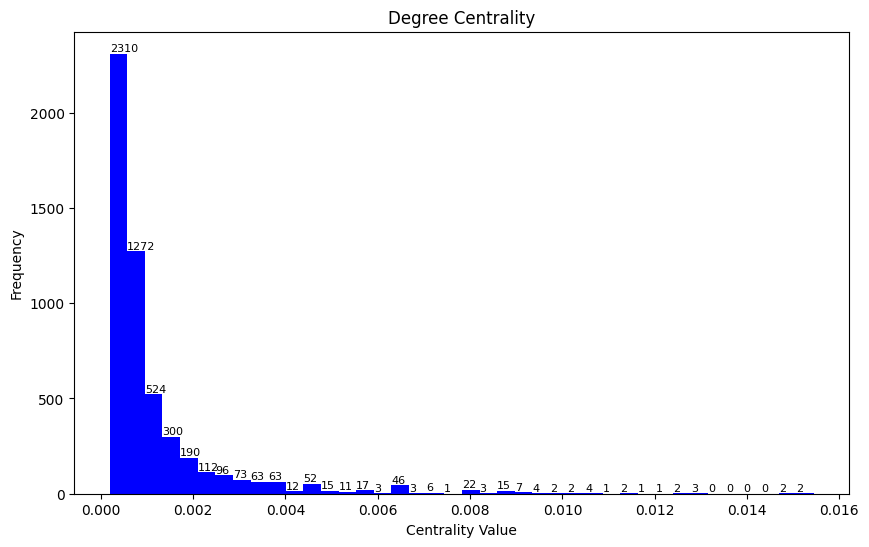

In [ ]:
# Plot distribution of centrality values for Degree Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Degree Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Eignevector Centrality**

In [ ]:
#Calculate Eignevector Centrality
eigenvector_centrality = nx.eigenvector_centrality(G)

#Print each node and its Eignevector Centrality
for node, centrality in eigenvector_centrality.items():
    print(f"Node {node}: Eignevector Centrality = {centrality}")

Streaming output truncated to the last 5000 lines.
Node 824: Eignevector Centrality = 0.004896584661056391
Node 2133: Eignevector Centrality = 0.004484114570858193
Node 2654: Eignevector Centrality = 0.00497032355584485
Node 4748: Eignevector Centrality = 0.0008524037351398332
Node 5672: Eignevector Centrality = 0.00012149312563671556
Node 10549: Eignevector Centrality = 0.0009168795354252775
Node 12928: Eignevector Centrality = 0.004478765533753731
Node 13220: Eignevector Centrality = 0.0005115710522945443
Node 14419: Eignevector Centrality = 0.010968460355685494
Node 17330: Eignevector Centrality = 0.004518455752228584
Node 17439: Eignevector Centrality = 0.0013051640732550651
Node 18487: Eignevector Centrality = 0.004941058504999814
Node 20850: Eignevector Centrality = 0.0016434808826085077
Node 22779: Eignevector Centrality = 0.004478765533753731
Node 23382: Eignevector Centrality = 0.005089047244097078
Node 24029: Eignevector Centrality = 0.0002493541951708901
Node 11785: Eignevec

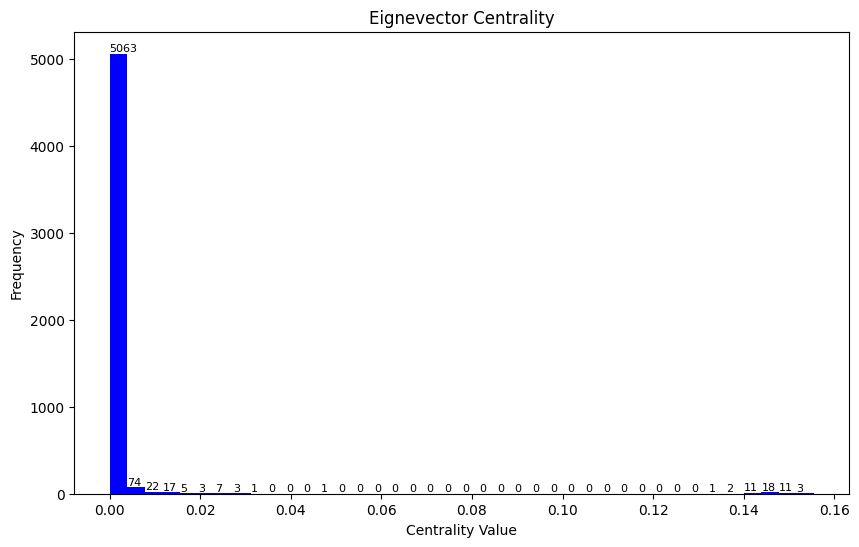

In [ ]:
# Plot distribution of centrality values for Eignevector Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Eignevector Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Katz Centrality**

In [ ]:
#Calculate Katz Centrality

#alpha: Attenuation factor for the Katz centrality computation. It controls the impact of indirect paths on centrality.
#       A smaller alpha reduces the influence of distant nodes, while a larger alpha gives more weight to longer paths.

#beta: A parameter that allows you to add a constant to each node's centrality, which can help control centrality values.
#      It can be useful for adjusting centrality scores to fit specific requirements or to balance the influence of different factors.

#normalized: If True, the Katz centrality scores are normalized so that they sum up to 1.
#            Normalization can be useful when comparing centrality scores across different networks
#            or when interpreting the scores in a relative manner.

#weight: None, string, or dictionary. If None, all edge weights are considered equal (1).
#        If a string, this should be the key for edge weight in the edge data dictionary.
#        If a dictionary, keys are node pairs and values are the edge weight between nodes.
#        Specifying edge weights can be important when the strength of connections between nodes varies.

katz_centrality = nx.katz_centrality_numpy(G, alpha=0.1, beta=1.0, normalized=True, weight=None)

# Print each node and its Katz Centrality
for node, centrality in katz_centrality.items():
    print(f"Node {node}: Katz Centrality = {centrality}")


Streaming output truncated to the last 5000 lines.
Node 824: Katz Centrality = -0.0016898639407773456
Node 2133: Katz Centrality = -0.00395900231378527
Node 2654: Katz Centrality = 0.011289654827563191
Node 4748: Katz Centrality = 0.00421413535067945
Node 5672: Katz Centrality = 0.00019597748004216797
Node 10549: Katz Centrality = 0.00048296007049550174
Node 12928: Katz Centrality = -0.004027880029767539
Node 13220: Katz Centrality = 0.008120713940609578
Node 14419: Katz Centrality = -0.01956538470004354
Node 17330: Katz Centrality = -0.0009334769702594611
Node 17439: Katz Centrality = 0.00997284948925211
Node 18487: Katz Centrality = 0.006114094171621015
Node 20850: Katz Centrality = 0.012196172699523413
Node 22779: Katz Centrality = -0.004027880029767591
Node 23382: Katz Centrality = -0.02121600981447688
Node 24029: Katz Centrality = 0.000757654875805362
Node 11785: Katz Centrality = 0.007847794750789623
Node 45: Katz Centrality = 0.0026515166054765903
Node 46: Katz Centrality = 0.01

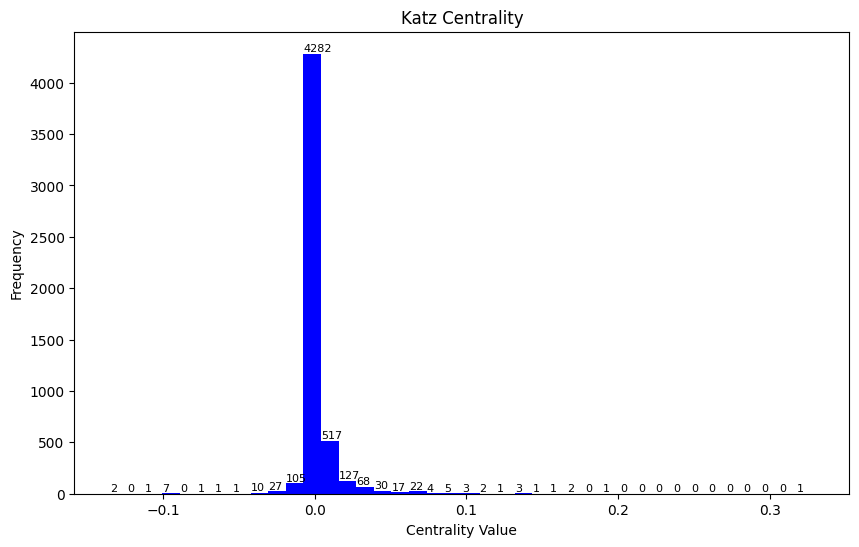

In [ ]:
# Plot distribution of centrality values for Katz Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Katz Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Page Rank**

In [ ]:
#Calculate Page Rank

#alpha: Damping parameter for PageRank, representing the probability of following a link on the graph vs. jumping to a random node.
#       A higher alpha means more weight is given to following links, while a lower alpha gives more weight to jumping to random nodes.
#       The default value of 0.8 is commonly used and provides a good balance between these two factors.
pr = nx.pagerank(G, alpha=0.8)

# Print each node and its Page Rank
for node, centrality in pr.items():
    print(f"Node {node}: Page Rank  = {centrality}")

Streaming output truncated to the last 5000 lines.
Node 824: Page Rank  = 0.00024224336022371474
Node 2133: Page Rank  = 0.0002271047334959895
Node 2654: Page Rank  = 0.0007201522726259025
Node 4748: Page Rank  = 0.0003052338922059694
Node 5672: Page Rank  = 8.23660615426491e-05
Node 10549: Page Rank  = 0.00010515883897878064
Node 12928: Page Rank  = 0.00020677233474065236
Node 13220: Page Rank  = 0.0002744972908753977
Node 14419: Page Rank  = 0.000247424530150465
Node 17330: Page Rank  = 0.00036154460942139745
Node 17439: Page Rank  = 0.0005138230370307156
Node 18487: Page Rank  = 0.0006019542895349898
Node 20850: Page Rank  = 0.0003362820639905861
Node 22779: Page Rank  = 0.00020677233474065236
Node 23382: Page Rank  = 0.0006570499254718355
Node 24029: Page Rank  = 0.0001278694518029153
Node 11785: Page Rank  = 0.0004697943797757689
Node 45: Page Rank  = 0.000467213200517954
Node 46: Page Rank  = 0.00036825301606330875
Node 570: Page Rank  = 0.0004707450567344558
Node 773: Page Rank 

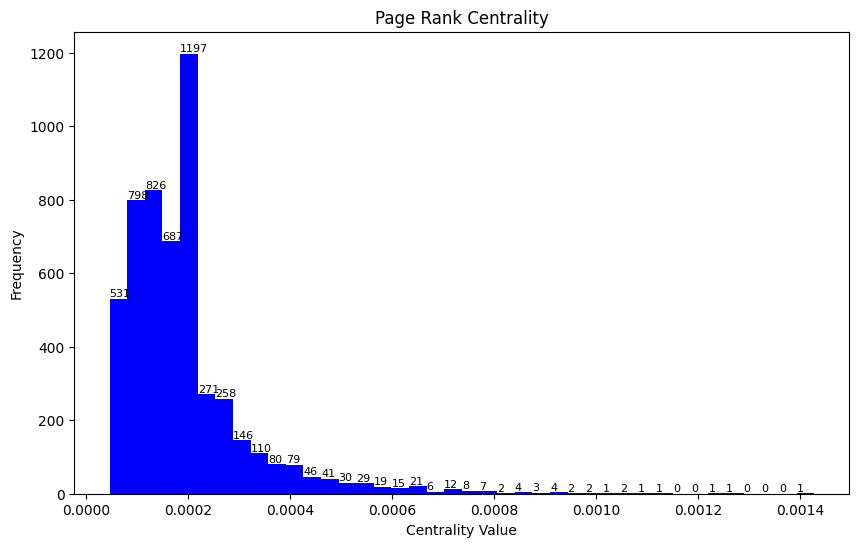

In [ ]:
# Plot distribution of centrality values for Page Rank Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Page Rank Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Local Clustering Coefficient**

In [ ]:
#Calculate Local Clustering Coefficient
local_clustering_coefficient = nx.clustering(G)

#Print each node and it's Clustering Coefficient
for node, local in local_clustering_coefficient.items():
    print(f"Node {node}: Local Clustering Coefficient = {local}")

Streaming output truncated to the last 5000 lines.
Node 824: Local Clustering Coefficient = 0.7307692307692307
Node 2133: Local Clustering Coefficient = 0.8484848484848485
Node 2654: Local Clustering Coefficient = 0.2503556187766714
Node 4748: Local Clustering Coefficient = 0.8245614035087719
Node 5672: Local Clustering Coefficient = 1.0
Node 10549: Local Clustering Coefficient = 0.6666666666666666
Node 12928: Local Clustering Coefficient = 1.0
Node 13220: Local Clustering Coefficient = 0.2909090909090909
Node 14419: Local Clustering Coefficient = 0.6593406593406593
Node 17330: Local Clustering Coefficient = 0.47794117647058826
Node 17439: Local Clustering Coefficient = 0.39901477832512317
Node 18487: Local Clustering Coefficient = 0.21367521367521367
Node 20850: Local Clustering Coefficient = 0.21904761904761905
Node 22779: Local Clustering Coefficient = 1.0
Node 23382: Local Clustering Coefficient = 0.2045977011494253
Node 24029: Local Clustering Coefficient = 0.4
Node 11785: Local C

**Average Local Clustering Coefficient**

In [ ]:
#Calculate Average Local Clustering Coefficient
average_local_clustering_coefficient = nx.average_clustering(G)

print("Average Local Clustering Coefficient:", average_local_clustering_coefficient)

Average Local Clustering Coefficient: 0.529635811052136


**Global Clustering Coefficient**

In [ ]:
#Calculate Global Clustering Coefficient
global_clustering_coefficient = nx.transitivity(G)

#Print Global Clustering Coefficient
print("Global Clustering Coefficient:", global_clustering_coefficient)

Global Clustering Coefficient: 0.6298424741263426


**Betweenness Centrality**

In [ ]:
#Calculate Betweenness Centrality

#normalized: If True, the betweenness centrality scores are normalized by dividing by the maximum possible betweenness centrality.
#            Normalization is useful for comparing centrality scores across graphs of different sizes.

#endpoints: If False, only considers paths between nodes as they are internal to the node set.
#           If True, considers both endpoints of the paths as adjacent to other nodes outside the node set.
#           Setting endpoints to False is often appropriate when analyzing networks where nodes represent entities that cannot pass through each other.

bet_centrality = nx.betweenness_centrality(G, normalized = True,endpoints = False)

#Print each node and its Betweenness Centrality (excluding nodes with centrality = 0)
for node, centrality in bet_centrality.items():
    if centrality != 0:
        print(f"Node {node}: Betweenness Centrality = {centrality}")


Node 3466: Betweenness Centrality = 0.001715248119663197
Node 937: Betweenness Centrality = 0.0003493412893676944
Node 8579: Betweenness Centrality = 0.00035838805830684087
Node 10310: Betweenness Centrality = 0.00875853820067516
Node 15931: Betweenness Centrality = 0.0030060929955505167
Node 17038: Betweenness Centrality = 0.00971923662472634
Node 19607: Betweenness Centrality = 3.0514881952662607e-05
Node 1854: Betweenness Centrality = 0.0010775207556511723
Node 4583: Betweenness Centrality = 0.0003399339237399931
Node 9572: Betweenness Centrality = 0.025689005573850524
Node 10841: Betweenness Centrality = 0.002707168068342148
Node 13056: Betweenness Centrality = 0.00365890399868271
Node 16310: Betweenness Centrality = 0.010148759874837855
Node 19640: Betweenness Centrality = 0.007180519085070411
Node 23855: Betweenness Centrality = 0.0034016137786973756
Node 24814: Betweenness Centrality = 0.005502571992543268
Node 5052: Betweenness Centrality = 0.024422231614460266
Node 899: Betwee

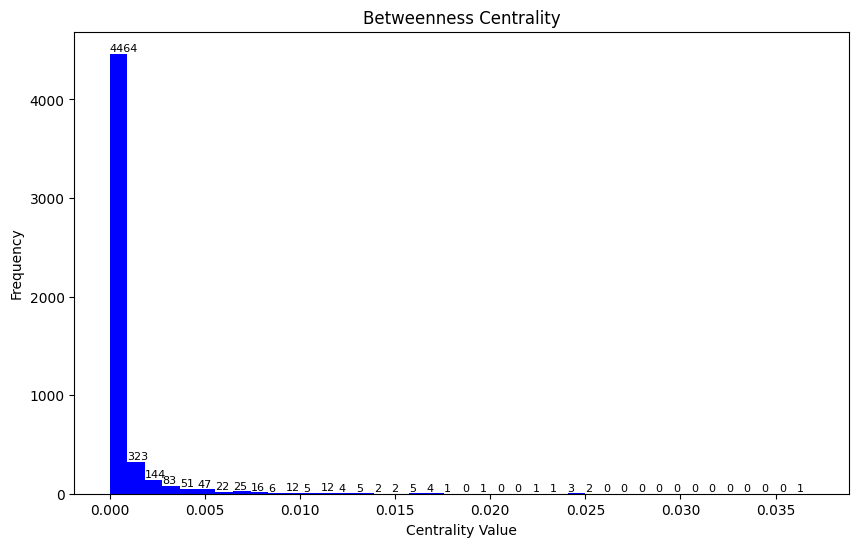

In [ ]:
# Plot distribution of centrality values for Betweenness Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Betweenness Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Closeness centrality**

In [ ]:
#Calculate Closeness centrality
close_centrality = nx.closeness_centrality(G)

#Print each node and its Closeness centrality
for node, centrality in close_centrality.items():
    print(f"Node {node}: Closeness centrality = {centrality}")

Streaming output truncated to the last 5000 lines.
Node 824: Closeness centrality = 0.16764310255837436
Node 2133: Closeness centrality = 0.16273651552826154
Node 2654: Closeness centrality = 0.18712852106232164
Node 4748: Closeness centrality = 0.16554724813566837
Node 5672: Closeness centrality = 0.14883783420385985
Node 10549: Closeness centrality = 0.15877899167476198
Node 12928: Closeness centrality = 0.16272848391659792
Node 13220: Closeness centrality = 0.16010510542478912
Node 14419: Closeness centrality = 0.16450653799920706
Node 17330: Closeness centrality = 0.16938274638436798
Node 17439: Closeness centrality = 0.17198917850493492
Node 18487: Closeness centrality = 0.1784684460686391
Node 20850: Closeness centrality = 0.16962673840508835
Node 22779: Closeness centrality = 0.16272848391659792
Node 23382: Closeness centrality = 0.17893333375579895
Node 24029: Closeness centrality = 0.14628885669808364
Node 11785: Closeness centrality = 0.17686019101636577
Node 45: Closeness ce

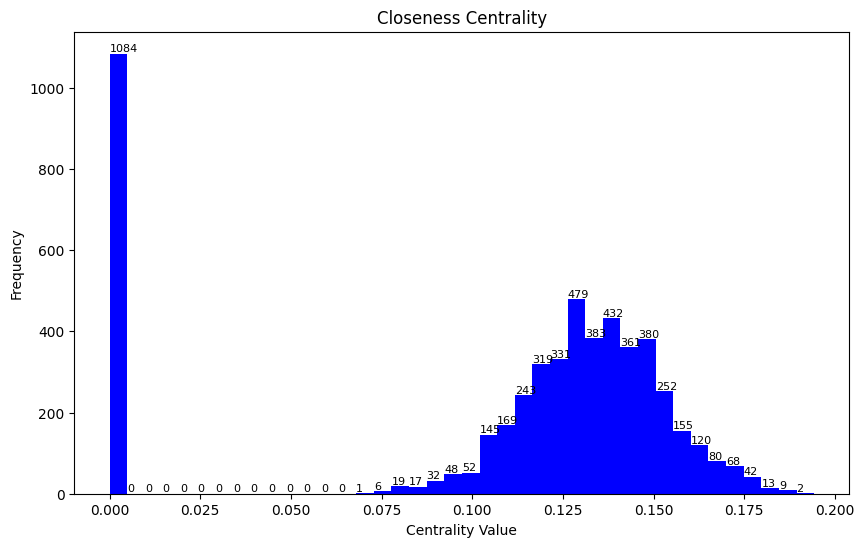

In [ ]:
# Plot distribution of centrality values for Closeness Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Closeness Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Reciprocity**

In [ ]:
reciprocity = nx.reciprocity(G)
print("Reciprocity:", reciprocity)

Reciprocity: 0.0


**Transitivity**

In [ ]:
transitivity = nx.transitivity(G)
print("Transitivity:", transitivity)

Transitivity: 0.6298424741263426


**Top 10 for each Centrality Measure**

In [ ]:
#Create Dataframes for Centrality Measures to Store Top 10

df_degree = pd.DataFrame(list(deg_centrality.items()), columns=['Node', 'Degree Centrality']).nlargest(10, 'Degree Centrality')
df_eigenvector = pd.DataFrame(list(eigenvector_centrality.items()), columns=['Node', 'Eigenvector Centrality']).nlargest(10, 'Eigenvector Centrality')
df_katz = pd.DataFrame(list(katz_centrality.items()), columns=['Node', 'Katz Centrality']).nlargest(10, 'Katz Centrality')
df_pagerank = pd.DataFrame(list(pr.items()), columns=['Node', 'PageRank Centrality']).nlargest(10, 'PageRank Centrality')
df_betweenness = pd.DataFrame(list(bet_centrality.items()), columns=['Node', 'Betweenness Centrality']).nlargest(10, 'Betweenness Centrality')
df_closeness = pd.DataFrame(list(close_centrality.items()), columns=['Node', 'Closeness Centrality']).nlargest(10, 'Closeness Centrality')


In [ ]:
#Print Top 10
print("\nTop 10 nodes by Degree Centrality:")
print(df_degree.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Eigenvector Centrality:")
print(df_eigenvector.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Katz Centrality:")
print(df_katz.to_string(index=False, justify='center'))

print("\nTop 10 nodes by PageRank Centrality:")
print(df_pagerank.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Betweenness Centrality:")
print(df_betweenness.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Closeness Centrality:")
print(df_closeness.to_string(index=False, justify='center'))


Top 10 nodes by Degree Centrality:
 Node  Degree Centrality
21012      0.015455     
21281      0.015073     
22691      0.014692     
12365      0.014692     
 6610      0.012975     
 9785      0.012975     
21508      0.012784     
17655      0.012593     
 2741      0.012402     
19423      0.012021     

Top 10 nodes by Eigenvector Centrality:
 Node  Eigenvector Centrality
21012         0.155561       
 2741         0.153574       
12365         0.153072       
21508         0.151194       
 9785         0.150903       
15003         0.150407       
25346         0.149069       
 7956         0.149066       
14807         0.149007       
12781         0.148881       

Top 10 nodes by Katz Centrality:
 Node  Katz Centrality
13801     0.329264    
 5901     0.196795    
25006     0.168997    
13142     0.167177    
 5953     0.161180    
 1588     0.153601    
13096     0.139432    
23939     0.135106    
23134     0.132340    
 5695     0.120516    

Top 10 nodes by PageRank Centr

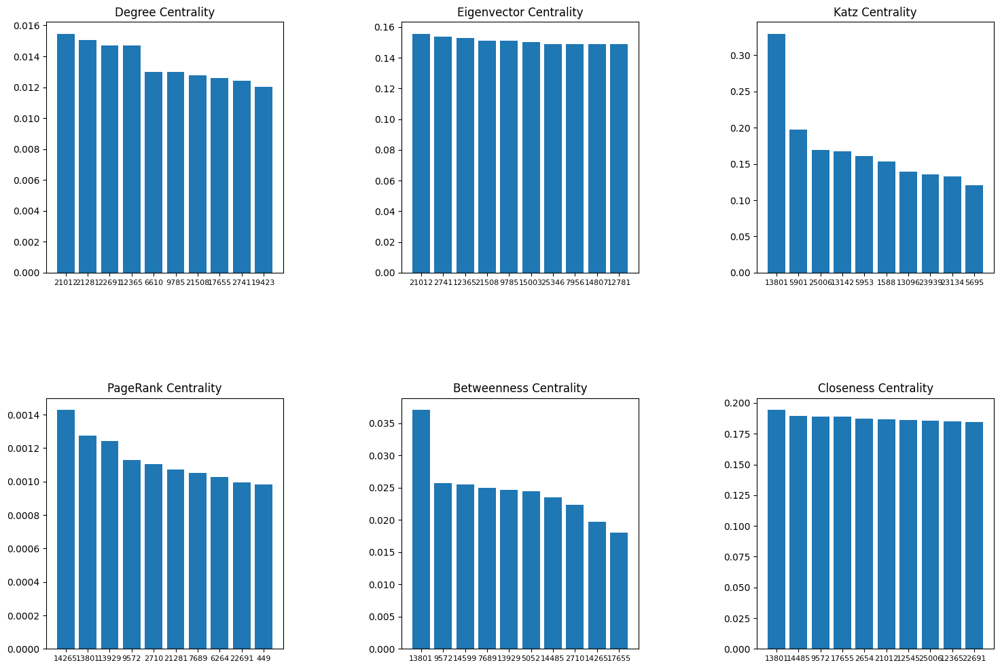

In [ ]:
#Visualize the Top 10 for Each Centrality Measure
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.bar(df_degree['Node'], df_degree['Degree Centrality'])
plt.title('Degree Centrality')
plt.xticks(fontsize=8)

plt.subplot(2, 3, 2)
plt.bar(df_eigenvector['Node'], df_eigenvector['Eigenvector Centrality'])
plt.title('Eigenvector Centrality')
plt.xticks(fontsize=8)

plt.subplot(2, 3, 3)
plt.bar(df_katz['Node'], df_katz['Katz Centrality'])
plt.title('Katz Centrality')
plt.xticks(fontsize=8)

plt.subplot(2, 3, 4)
plt.bar(df_pagerank['Node'], df_pagerank['PageRank Centrality'])
plt.title('PageRank Centrality')
plt.xticks(fontsize=8)

plt.subplot(2, 3, 5)
plt.bar(df_betweenness['Node'], df_betweenness['Betweenness Centrality'])
plt.title('Betweenness Centrality')
plt.xticks(fontsize=8)

plt.subplot(2, 3, 6)
plt.bar(df_closeness['Node'], df_closeness['Closeness Centrality'])
plt.title('Closeness Centrality')
plt.xticks(fontsize=8)

plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()

**Local Clustering Coefficient Statistics**

In [ ]:
#Create a table for the top 10 nodes with highest local clustering coefficients
top_10_nodes = sorted(local_clustering_coefficient.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 Nodes with Highest Local Clustering Coefficients:")
print("Node\tLocal Clustering Coefficient")
for node, coeff in top_10_nodes:
    print(f"{node}\t{coeff}")

Top 10 Nodes with Highest Local Clustering Coefficients:
Node	Local Clustering Coefficient
5233	1.0
18720	1.0
14982	1.0
1796	1.0
6376	1.0
4822	1.0
6864	1.0
20886	1.0
23298	1.0
23945	1.0


In [ ]:
#Count the number of nodes with local clustering coefficient equal to 1
nodes_with_coefficient_1 = sum(1 for coeff in local_clustering_coefficient.values() if coeff == 1)
print(f"Number of Nodes with Local Clustering Coefficient 1: {nodes_with_coefficient_1}")

Number of Nodes with Local Clustering Coefficient 1: 2038


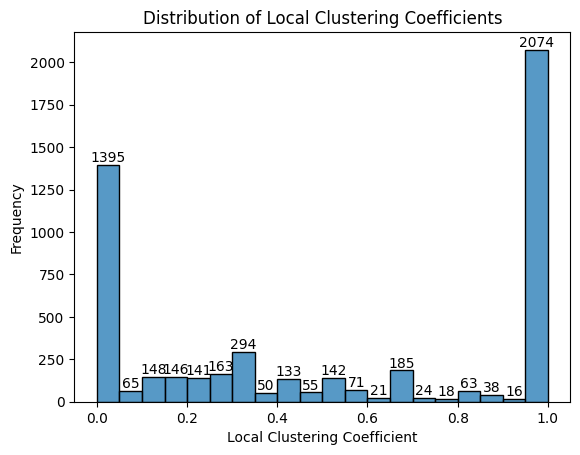

In [ ]:
#Create a line chart for the distribution of local clustering coefficients
coefficients = list(local_clustering_coefficient.values())
coefficients.sort()
unique_coefficients = list(set(coefficients))
counts = [coefficients.count(coeff) for coeff in unique_coefficients]

#Create a histogram for the distribution of local clustering coefficients
sns.histplot(list(local_clustering_coefficient.values()), bins=20, kde=False)
plt.xlabel('Local Clustering Coefficient')
plt.ylabel('Frequency')
plt.title('Distribution of Local Clustering Coefficients')

#Display the frequency count on top of each bin
for p in plt.gca().patches:
    plt.gca().annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='bottom', color='black', fontsize=10)

plt.show()

**Visulize Centrality Measure**

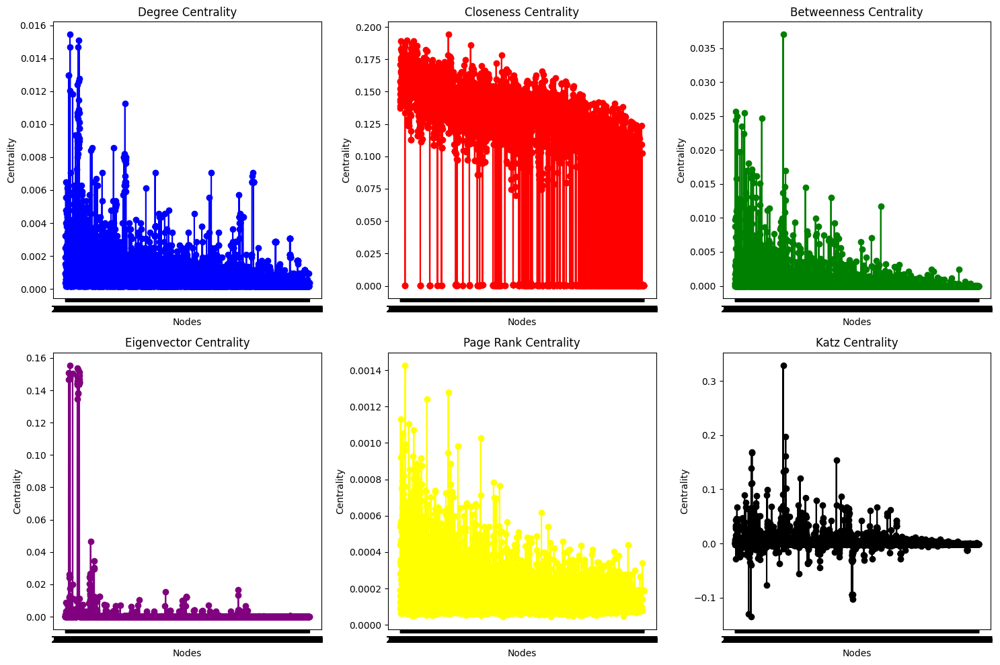

In [ ]:
#Convert centrality measures to lists for plotting
nodes = list(G.nodes())
degree_values = [deg_centrality[node] for node in nodes]
closeness_values = [close_centrality[node] for node in nodes]
betweenness_values = [bet_centrality[node] for node in nodes]
eigenvector_values = [eigenvector_centrality[node] for node in nodes]
page_rank = [pr[node] for node in nodes]
katz_values = [katz_centrality[node] for node in nodes]

#Plot centrality measures
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.plot(nodes, degree_values, marker='o', linestyle='-', color='b')
plt.title('Degree Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 2)
plt.plot(nodes, closeness_values, marker='o', linestyle='-', color='r')
plt.title('Closeness Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 3)
plt.plot(nodes, betweenness_values, marker='o', linestyle='-', color='g')
plt.title('Betweenness Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 4)
plt.plot(nodes, eigenvector_values, marker='o', linestyle='-', color='purple')
plt.title('Eigenvector Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 5)
plt.plot(nodes, page_rank, marker='o', linestyle='-', color='yellow')
plt.title('Page Rank Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 6)
plt.plot(nodes, katz_values, marker='o', linestyle='-', color='black')
plt.title('Katz Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.tight_layout()
plt.show()

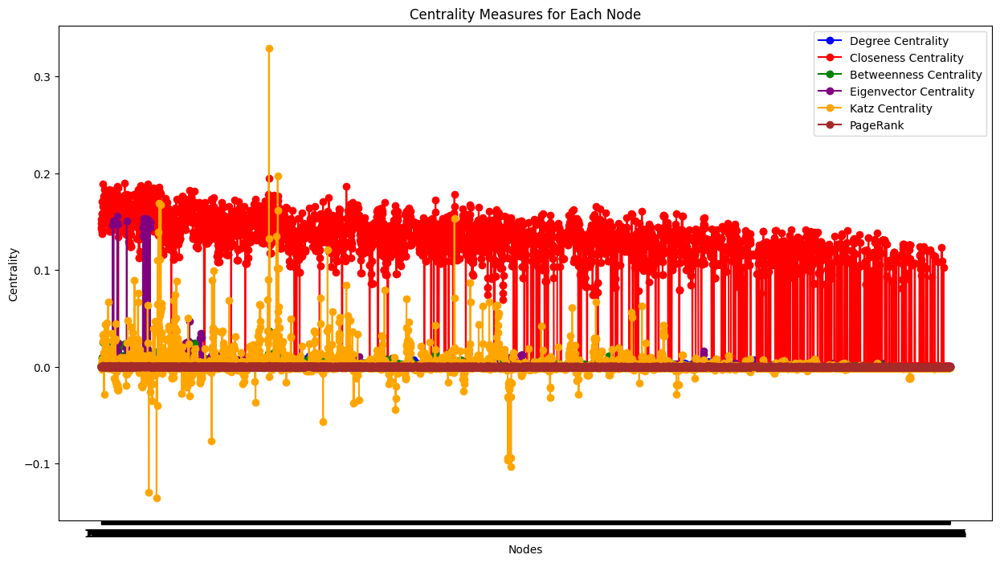

In [ ]:
# Plot centrality measures
plt.figure(figsize=(15, 8))

plt.plot(nodes, degree_values, marker='o', linestyle='-', color='b', label='Degree Centrality')
plt.plot(nodes, closeness_values, marker='o', linestyle='-', color='r', label='Closeness Centrality')
plt.plot(nodes, betweenness_values, marker='o', linestyle='-', color='g', label='Betweenness Centrality')
plt.plot(nodes, eigenvector_values, marker='o', linestyle='-', color='purple', label='Eigenvector Centrality')
plt.plot(nodes, katz_values, marker='o', linestyle='-', color='orange', label='Katz Centrality')
plt.plot(nodes, page_rank, marker='o', linestyle='-', color='brown', label='PageRank')

plt.title('Centrality Measures for Each Node')
plt.xlabel('Nodes')
plt.ylabel('Centrality')
plt.legend()
plt.grid(False)
plt.show()

**Correlation Matrix**

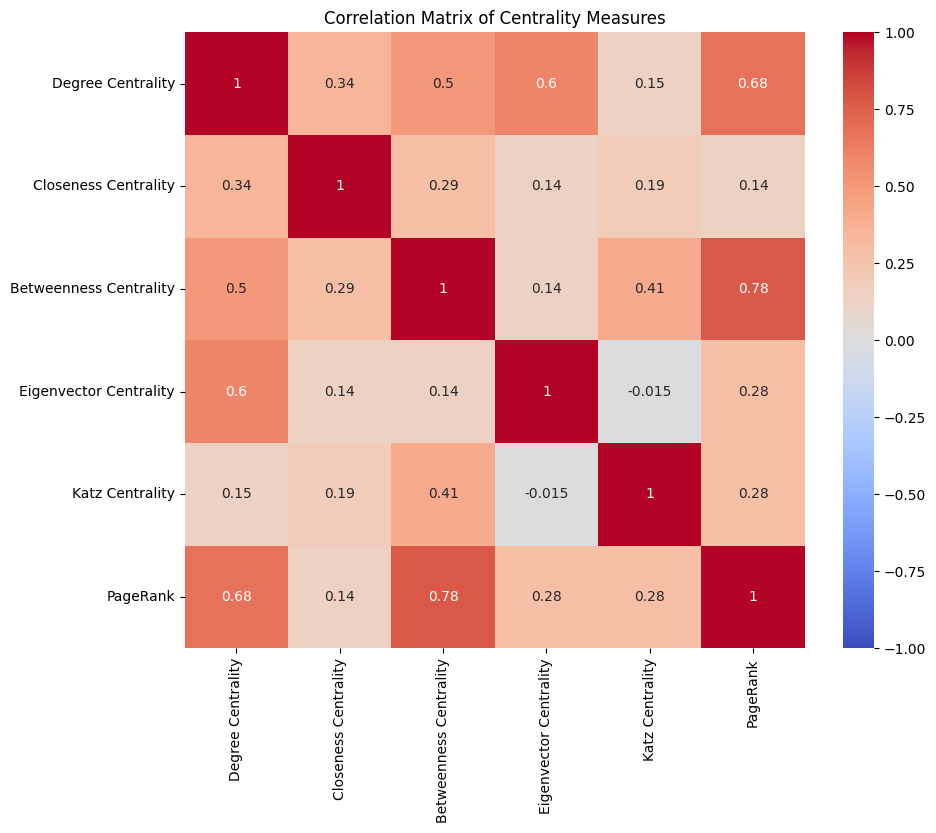

In [ ]:
# Create a DataFrame from the centrality measures
data = {
    "Degree Centrality": list(deg_centrality.values()),
    "Closeness Centrality": list(close_centrality.values()),
    "Betweenness Centrality": list(bet_centrality.values()),
    "Eigenvector Centrality": list(eigenvector_centrality.values()),
    "Katz Centrality": list(katz_centrality.values()),
    "PageRank": list(pr.values())
}
df = pd.DataFrame(data)

# Calculate correlation matrix
correlation_matrix = df.corr()

# Plot correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Matrix of Centrality Measures")
plt.show()

# A high correlation between PageRank and Betweenness Centrality suggests that nodes that are important according to PageRank tend to also have high betweenness centrality, and vice versa. This could indicate that nodes that are important in terms of their connections to other important nodes (PageRank) also tend to lie on many shortest paths between other nodes (Betweenness Centrality).



In [ ]:
#Compare centrality measures based on criteria

mean_degree = sum(deg_centrality.values()) / len(deg_centrality)
mean_closeness = sum(close_centrality.values()) / len(close_centrality)
mean_betweenness = sum(bet_centrality.values()) / len(bet_centrality)
mean_eigenvector = sum(eigenvector_centrality.values()) / len(eigenvector_centrality)
mean_katz = sum(katz_centrality.values()) / len(katz_centrality)
mean_pagerank = sum(pr.values()) / len(pr)

print("Mean Degree Centrality:", mean_degree)
print("Mean Closeness Centrality:", mean_closeness)
print("Mean Betweenness Centrality:", mean_betweenness)
print("Mean Eigenvector Centrality:", mean_eigenvector)
print("Mean Katz Centrality:", mean_katz)
print("Mean PageRank:", mean_pagerank)

Mean Degree Centrality: 0.001055278280507871
Mean Closeness Centrality: 0.10630130466095028
Mean Betweenness Centrality: 0.0006062707858585091
Mean Eigenvector Centrality: 0.0016145570004595063
Mean Katz Centrality: 0.001991474673439358
Mean PageRank: 0.0001907668828691324


**Largest Connected Component**

Number of nodes in the largest connected component: 4158
Number of edges in the largest connected component: 13428


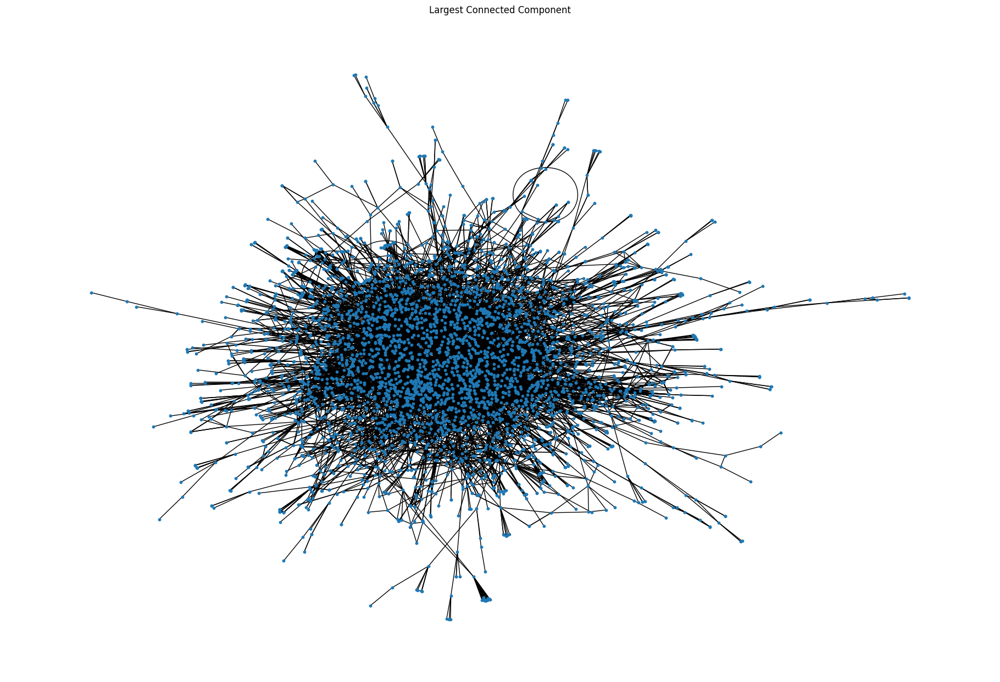

In [ ]:
#Find the largest connected component
largest_component = max(nx.connected_components(G), key=len)

#Create a subgraph of the largest connected component
largest_component_subgraph = G.subgraph(largest_component)

#Print the number of nodes and edges in the largest connected component
print("Number of nodes in the largest connected component:", largest_component_subgraph.number_of_nodes())
print("Number of edges in the largest connected component:", largest_component_subgraph.number_of_edges())

#Visualize the largest connected component
plt.figure(figsize=(18, 12))
nx.draw(largest_component_subgraph, with_labels=False, node_size = 10)
plt.title('Largest Connected Component')
plt.show()

**Network**

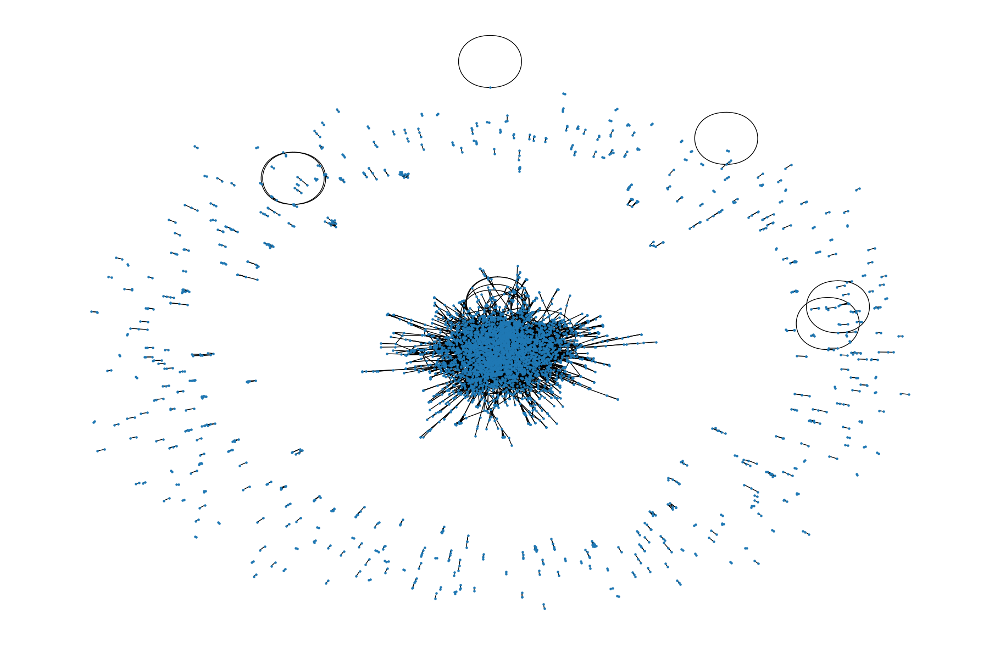

In [ ]:
plt.figure(figsize=(18, 12))
nx.draw(G, with_labels=False, node_size = 5, width = 1)
plt.show()

**Dataset 2 - Euroroad**

In [ ]:
#Importing Euroroad Dataset which contains Edges
PATH = "/content/Euroroad.txt"
G = nx.read_edgelist(PATH)

In [ ]:
#Importing Euro_city Dataset which contains City Names
PATH2 = "/content/Euro_city.txt"
with open(PATH2, 'r') as f:
    node_names = f.read().splitlines()

**Network Statistics**

In [ ]:
#Calculating the Degree of Each Node In the Network
degrees = dict(G.degree())

#Find the nodes with maximum and minimum degree
max_degree_node = max(degrees, key=degrees.get)
min_degree_node = min(degrees, key=degrees.get)

#Adjust node numbering and mapping
node_name_mapping = {str(i+1): name for i, name in enumerate(node_names)}  # Adjusted for node numbers
nx.relabel_nodes(G, node_name_mapping, copy=False)

#Print the name of the city with the maximum and minimum degree
print("City with maximum degree:", max_degree_node, "Degree:", degrees[max_degree_node])
print("City with minimum degree:", min_degree_node, "Degree:", degrees[min_degree_node])

City with maximum degree: Moscow Degree: 10
City with minimum degree: Greenock Degree: 1


In [ ]:
degrees_values = list(degrees.values())

print('Number of nodes', len(G.nodes))
print('Number of edges', len(G.edges))
avg_degree = np.mean(degrees_values)
std_dev = np.std(degrees_values)

print(f"Standard Deviation: {std_dev}")
print(f"Average Degree: {avg_degree}")

Number of nodes 1174
Number of edges 1417
Standard Deviation: 1.188678457809932
Average Degree: 2.41396933560477


In [ ]:
#Node and their corresponding City
for node, city in node_name_mapping.items():
    print("Node:", node, "City:", city)

Node: 1 City: Greenock
Node: 2 City: Glasgow
Node: 3 City: Preston
Node: 4 City: Birmingham
Node: 5 City: Southampton
Node: 6 City: Le Havre
Node: 7 City: Paris
Node: 8 City: Orléans
Node: 9 City: Bordeaux
Node: 10 City: San Sebastián
Node: 11 City: Burgos
Node: 12 City: Madrid
Node: 13 City: Seville
Node: 14 City: Algeciras
Node: 15 City: Inverness
Node: 16 City: Perth
Node: 17 City: Edinburgh
Node: 18 City: Newcastle
Node: 19 City: London
Node: 20 City: Folkestone
Node: 21 City: Dover
Node: 22 City: Calais
Node: 23 City: Lyon
Node: 24 City: Orange
Node: 25 City: Narbonne
Node: 26 City: Girona
Node: 27 City: Barcelona
Node: 28 City: Tarragona
Node: 29 City: Castellón de la Plana
Node: 30 City: Valencia
Node: 31 City: Alicante
Node: 32 City: Murcia
Node: 33 City: Almería
Node: 34 City: Málaga
Node: 35 City: Hook of Holland
Node: 36 City: Rotterdam
Node: 37 City: Eindhoven
Node: 38 City: Maastricht
Node: 39 City: Liège
Node: 40 City: Bastogne
Node: 41 City: Arlon
Node: 42 City: Luxembou

In [ ]:
for node, degree in degrees.items():
    print(f"Node {node}: Degree {degree}")

Node 1: Degree 1
Node 2: Degree 3
Node 3: Degree 2
Node 17: Degree 3
Node 4: Degree 3
Node 5: Degree 1
Node 855: Degree 2
Node 6: Degree 2
Node 7: Degree 8
Node 880: Degree 2
Node 8: Degree 5
Node 22: Degree 3
Node 23: Degree 6
Node 411: Degree 5
Node 453: Degree 5
Node 454: Degree 5
Node 889: Degree 2
Node 9: Degree 5
Node 479: Degree 4
Node 480: Degree 2
Node 561: Degree 5
Node 10: Degree 4
Node 537: Degree 4
Node 1074: Degree 3
Node 11: Degree 3
Node 536: Degree 3
Node 12: Degree 5
Node 560: Degree 2
Node 13: Degree 4
Node 27: Degree 4
Node 30: Degree 3
Node 559: Degree 4
Node 14: Degree 2
Node 596: Degree 2
Node 1138: Degree 2
Node 34: Degree 3
Node 15: Degree 1
Node 16: Degree 2
Node 18: Degree 3
Node 19: Degree 5
Node 823: Degree 2
Node 20: Degree 2
Node 388: Degree 2
Node 389: Degree 3
Node 627: Degree 2
Node 21: Degree 1
Node 409: Degree 4
Node 885: Degree 4
Node 24: Degree 3
Node 538: Degree 4
Node 1078: Degree 1
Node 1109: Degree 2
Node 25: Degree 2
Node 1110: Degree 2
Node 2

**Degree Distribution of the Network**

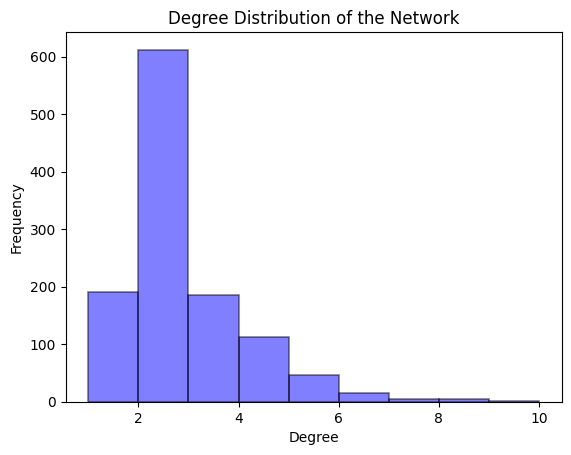

In [ ]:
degrees = [G.degree(node) for node in G.nodes()]
plt.hist(degrees, bins=range(min(degrees), max(degrees)+1), alpha=0.5, color='b', edgecolor='black', linewidth=1.2)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution of the Network')
plt.show()

In [ ]:
num_iterations = 10
total_steps = 0

def initialize_activation_probabilities(G):
    for node in G.nodes():
        neighbors = list(G.neighbors(node))
        total_prob = 1.0
        G.nodes[node]['activation_probability'] = {}
        for neighbor in neighbors:
            if neighbor not in G.nodes():
                neighbor = random.choice(list(G.nodes()))
            p = random.uniform(0, total_prob)
            G.nodes[node]['activation_probability'][neighbor] = p
            total_prob -= p

def independent_cascade_model(G, initial_nodes):
    activated_nodes = set(initial_nodes)
    new_nodes_activated = True
    max_steps = 0

    while new_nodes_activated:
        new_nodes_activated = False
        new_activated_nodes = set()

        for node in activated_nodes:
            neighbors = list(G.neighbors(node))

            for neighbor in neighbors:
                if neighbor not in activated_nodes:
                    activation_probability = G.nodes[node]['activation_probability'].get(neighbor, 0)
                    if random.random() < activation_probability:
                        new_activated_nodes.add(neighbor)
                        new_nodes_activated = True

        activated_nodes |= new_activated_nodes
        max_steps += 1

    return len(activated_nodes), max_steps

for _ in range(num_iterations):
    start_nodes = random.sample(list(G.nodes()), 2)
    initial_nodes = start_nodes
    initialize_activation_probabilities(G)
    activated_nodes, max_steps = independent_cascade_model(G, initial_nodes)
    total_steps += max_steps
    print("Start Nodes:", start_nodes)
    print("Activated Nodes:", activated_nodes)
    print("Max Steps:", max_steps)
    print("-------------------------")

average_steps = total_steps / num_iterations
print("Average number of steps required:", average_steps)

Start Nodes: ['Zhaksy', 'Abrantes']
Activated Nodes: 5
Max Steps: 3
-------------------------
Start Nodes: ['Agrinio', 'Warsaw']
Activated Nodes: 569
Max Steps: 101
-------------------------
Start Nodes: ['Oradea', 'Torres Novas']
Activated Nodes: 599
Max Steps: 84
-------------------------
Start Nodes: ['Rovaniemi', 'Korczowa']
Activated Nodes: 697
Max Steps: 115
-------------------------
Start Nodes: ['Braunschweig', 'Manisa']
Activated Nodes: 625
Max Steps: 98
-------------------------
Start Nodes: ['Sarreguemines', 'Kiev']
Activated Nodes: 4
Max Steps: 2
-------------------------
Start Nodes: ['Kaunas', 'Pristina']
Activated Nodes: 7
Max Steps: 4
-------------------------
Start Nodes: ['Sary Tash', 'Avellino']
Activated Nodes: 11
Max Steps: 5
-------------------------
Start Nodes: ['Valmiera', 'Örnsköldsvik']
Activated Nodes: 343
Max Steps: 65
-------------------------
Start Nodes: ['Astara', 'Yekaterinburg']
Activated Nodes: 26
Max Steps: 12
-------------------------
Average numbe

**Degree Centrality**

In [ ]:
def degree_centrality(G, node):
    neighbors = G[node]
    degree = len(neighbors)
    return degree / (len(G) - 1)

# Calculate degree centrality for each node
deg_centrality = {}
for node in G.nodes():
    deg_centrality[node] = degree_centrality(G, node)

# Print each node and its Degree Centrality
for node, centrality in deg_centrality.items():
    print(f"{node}: Degree Centrality = {centrality}")

Greenock: Degree Centrality = 0.0008525149190110827
Glasgow: Degree Centrality = 0.0025575447570332483
Preston: Degree Centrality = 0.0017050298380221654
Edinburgh: Degree Centrality = 0.0025575447570332483
Birmingham: Degree Centrality = 0.0025575447570332483
Southampton: Degree Centrality = 0.0008525149190110827
Cambridge: Degree Centrality = 0.0017050298380221654
Le Havre: Degree Centrality = 0.0017050298380221654
Paris: Degree Centrality = 0.0068201193520886615
Amiens: Degree Centrality = 0.0017050298380221654
Orléans: Degree Centrality = 0.004262574595055414
Calais: Degree Centrality = 0.0025575447570332483
Lyon: Degree Centrality = 0.005115089514066497
Brussels: Degree Centrality = 0.004262574595055414
Le Mans: Degree Centrality = 0.004262574595055414
Reims: Degree Centrality = 0.004262574595055414
Chaumont: Degree Centrality = 0.0017050298380221654
Bordeaux: Degree Centrality = 0.004262574595055414
Tours: Degree Centrality = 0.0034100596760443308
Montargis: Degree Centrality = 0

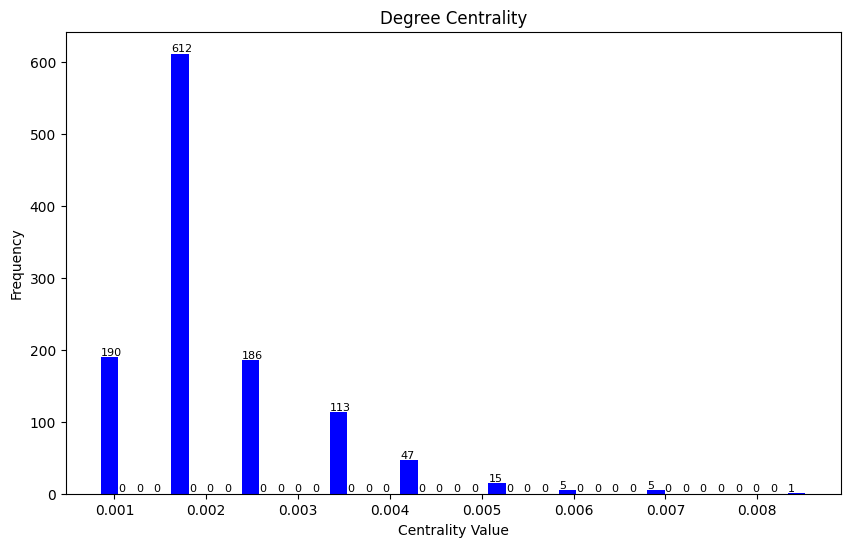

In [ ]:
# Plot distribution of centrality values for Degree Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Degree Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(deg_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Eignevector Centrality**

In [ ]:
#Calculate Eignevector Centrality
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1500)

#Print each node and its Eignevector Centrality
for node, centrality in eigenvector_centrality.items():
    print(f"Node {node}: Eignevector Centrality = {centrality}")

Node Greenock: Eignevector Centrality = 9.010240097441841e-41
Node Glasgow: Eignevector Centrality = 2.3665843628651558e-40
Node Preston: Eignevector Centrality = 1.453975684665703e-40
Node Edinburgh: Eignevector Centrality = 3.860951807424138e-40
Node Birmingham: Eignevector Centrality = 1.4523550683859124e-40
Node Southampton: Eignevector Centrality = 5.529516749215189e-41
Node Cambridge: Eignevector Centrality = 1.807755442423693e-40
Node Le Havre: Eignevector Centrality = 0.10949538709256859
Node Paris: Eignevector Centrality = 0.36511651698060815
Node Amiens: Eignevector Centrality = 0.07401128759220409
Node Orléans: Eignevector Centrality = 0.20163936473473298
Node Calais: Eignevector Centrality = 0.1515682227257325
Node Lyon: Eignevector Centrality = 0.17608234918767382
Node Brussels: Eignevector Centrality = 0.2362520019996283
Node Le Mans: Eignevector Centrality = 0.20410065289163792
Node Reims: Eignevector Centrality = 0.2807572358876249
Node Chaumont: Eignevector Centrality 

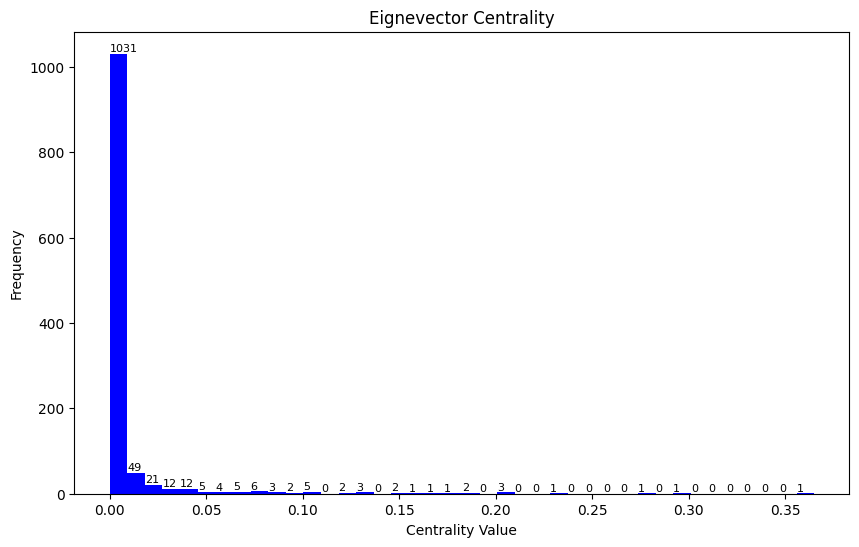

In [ ]:
# Plot distribution of centrality values for Eignevector Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Eignevector Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(eigenvector_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Katz Centrality**

In [ ]:
# Calculate Katz Centrality

#alpha: Attenuation factor for the Katz centrality computation. It controls the impact of indirect paths on centrality.
#       A smaller alpha reduces the influence of distant nodes, while a larger alpha gives more weight to longer paths.

#beta: A parameter that allows you to add a constant to each node's centrality, which can help control centrality values.
#      It can be useful for adjusting centrality scores to fit specific requirements or to balance the influence of different factors.

#normalized: If True, the Katz centrality scores are normalized so that they sum up to 1.
#            Normalization can be useful when comparing centrality scores across different networks or when interpreting the scores in a relative manner.

#weight: None, string, or dictionary. If None, all edge weights are considered equal (1).
#        If a string, this should be the key for edge weight in the edge data dictionary.
#        If a dictionary, keys are node pairs and values are the edge weight between nodes.
#        Specifying edge weights can be important when the strength of connections between nodes varies.

def katz(G, alpha=0.1, beta=1.0, normalized=True, weight=None):

    if len(G) == 0:
        return {}
    try:
        nodelist = beta.keys()
        if set(nodelist) != set(G):
            raise nx.NetworkXError("beta dictionary must have a value for every node")
        b = np.array(list(beta.values()), dtype=float)
    except AttributeError:
        nodelist = list(G)
        try:
            b = np.ones((len(nodelist), 1)) * beta
        except (TypeError, ValueError, AttributeError) as err:
            raise nx.NetworkXError("beta must be a number") from err

    A = nx.adjacency_matrix(G, nodelist=nodelist, weight=weight).todense().T
    n = A.shape[0]
    centrality = np.linalg.solve(np.eye(n, n) - (alpha * A), b).squeeze()

    # Normalize: rely on truediv to cast to float, then tolist to make Python numbers
    norm = np.sign(sum(centrality)) * np.linalg.norm(centrality) if normalized else 1
    return dict(zip(nodelist, (centrality / norm).tolist()))

katz_centrality = katz(G, alpha=0.1, beta=1.0, normalized=True, weight=None)

# Print each node and its Katz Centrality
for node, centrality in katz_centrality.items():
    print(f"Node {node}: Katz Centrality = {centrality}")

Node Greenock: Katz Centrality = 0.024398070022932306
Node Glasgow: Katz Centrality = 0.02962458502624735
Node Preston: Katz Centrality = 0.0273319942781061
Node Edinburgh: Katz Centrality = 0.030159670758359375
Node Birmingham: Katz Centrality = 0.02933924255173789
Node Southampton: Katz Centrality = 0.02436953577548136
Node Cambridge: Katz Centrality = 0.02733478026071568
Node Le Havre: Katz Centrality = 0.029379030453575913
Node Paris: Katz Centrality = 0.051339003513029925
Node Amiens: Katz Centrality = 0.0280951858196535
Node Orléans: Katz Centrality = 0.04086937493433413
Node Calais: Katz Centrality = 0.03351972331401641
Node Lyon: Katz Centrality = 0.0420679315019501
Node Brussels: Katz Centrality = 0.04110675250398564
Node Le Mans: Katz Centrality = 0.039806332069688165
Node Reims: Katz Centrality = 0.04202222567834332
Node Chaumont: Katz Centrality = 0.030262549471329878
Node Bordeaux: Katz Centrality = 0.039591649313321674
Node Tours: Katz Centrality = 0.03547564151381144
Nod

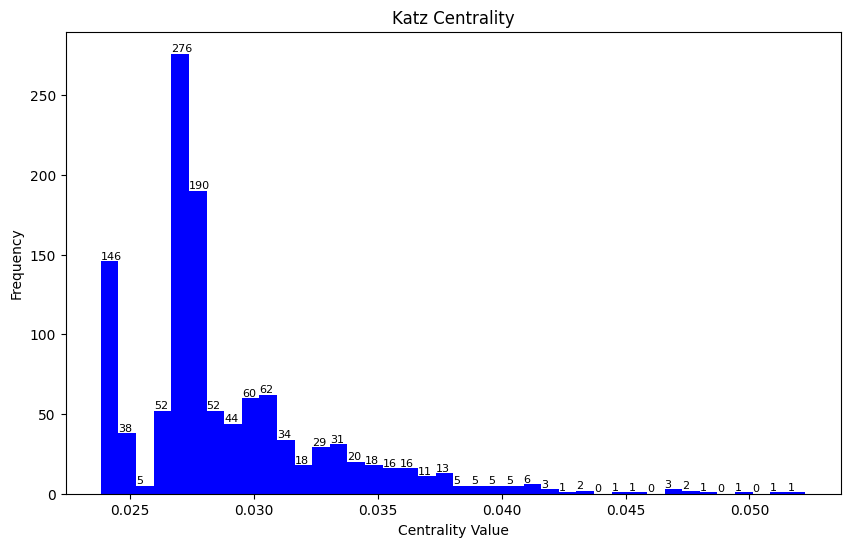

In [ ]:
# Plot distribution of centrality values for Katz Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Katz Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(katz_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Page Rank**

In [ ]:
# Calculate Page Rank

#alpha: Damping parameter for PageRank, representing the probability of following a link on the graph vs. jumping to a random node.
#       A higher alpha means more weight is given to following links, while a lower alpha gives more weight to jumping to random nodes.
#       The default value of 0.8 is commonly used and provides a good balance between these two factors.

def page_rank(G, alpha=0.85, max_iter=100, tol=1.0e-6, nstart=None, weight='weight'):

    if G.is_directed():
        in_degree = dict(nx.in_degree(G, weight=weight))
        min_in_degree = min(in_degree.values())
        if min_in_degree == 0:
            raise nx.NetworkXError("Graph contains nodes with no incoming edges.")
    else:
        in_degree = dict(nx.degree(G, weight=weight))

    if nstart is None:
        r = {node: 1/len(G) for node in G}
    else:
        r = nstart

    for _ in range(max_iter):
        rlast = r.copy()
        # Power iteration
        for n in G:
            r[n] = (1 - alpha) / len(G) + alpha * sum(rlast[m] / in_degree[m] for m in G.neighbors(n) if m in rlast)
        # check for convergence
        err = max(abs(r[n] - rlast[n]) for n in r)
        if err < tol:
            return r

    return r

# Calculate Page Rank for each node
pr = page_rank(G, alpha=0.8)

# Print each node and its Page Rank
for node, centrality in pr.items():
    print(f"Node {node}: Page Rank = {centrality}")

Node Greenock: Page Rank = 0.0004867479169697198
Node Glasgow: Page Rank = 0.0011863331891806353
Node Preston: Page Rank = 0.0008107042248702443
Node Edinburgh: Page Rank = 0.0011339880384864047
Node Birmingham: Page Rank = 0.001214721955049627
Node Southampton: Page Rank = 0.0004943140591782075
Node Cambridge: Page Rank = 0.000811799385349889
Node Le Havre: Page Rank = 0.0006005136140202516
Node Paris: Page Rank = 0.001858170335888205
Node Amiens: Page Rank = 0.0006108485974830208
Node Orléans: Page Rank = 0.001223713577290817
Node Calais: Page Rank = 0.000797097238946215
Node Lyon: Page Rank = 0.001691600402826762
Node Brussels: Page Rank = 0.0012058403804789243
Node Le Mans: Page Rank = 0.0012263377976879533
Node Reims: Page Rank = 0.001201866142848713
Node Chaumont: Page Rank = 0.000580647231456126
Node Bordeaux: Page Rank = 0.001294399399214824
Node Tours: Page Rank = 0.0010403078065313875
Node Montargis: Page Rank = 0.0006362528935960293
Node Toulouse: Page Rank = 0.0012367322538

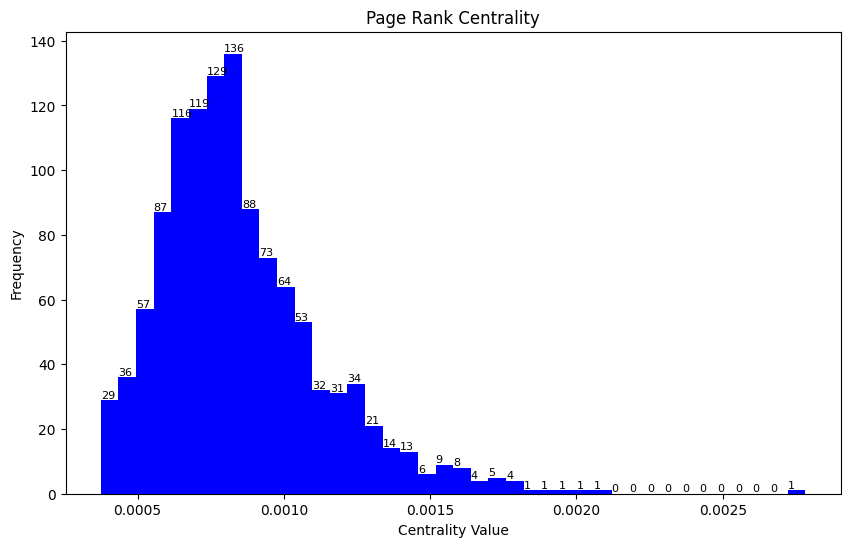

In [ ]:
# Plot distribution of centrality values for Page Rank Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Page Rank Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(pr.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Local Clustering Coefficient**

In [ ]:
# Calculate Local Clustering Coefficient
local_clustering_coefficient = nx.clustering(G)

# Print each node and it's Clustering Coefficient
for node, local in local_clustering_coefficient.items():
    print(f"Node {node}: Local Clustering Coefficient = {local}")

Node Greenock: Local Clustering Coefficient = 0
Node Glasgow: Local Clustering Coefficient = 0
Node Preston: Local Clustering Coefficient = 0
Node Edinburgh: Local Clustering Coefficient = 0
Node Birmingham: Local Clustering Coefficient = 0
Node Southampton: Local Clustering Coefficient = 0
Node Cambridge: Local Clustering Coefficient = 0
Node Le Havre: Local Clustering Coefficient = 0
Node Paris: Local Clustering Coefficient = 0
Node Amiens: Local Clustering Coefficient = 0
Node Orléans: Local Clustering Coefficient = 0.1
Node Calais: Local Clustering Coefficient = 0
Node Lyon: Local Clustering Coefficient = 0
Node Brussels: Local Clustering Coefficient = 0
Node Le Mans: Local Clustering Coefficient = 0.1
Node Reims: Local Clustering Coefficient = 0
Node Chaumont: Local Clustering Coefficient = 0
Node Bordeaux: Local Clustering Coefficient = 0.2
Node Tours: Local Clustering Coefficient = 0.16666666666666666
Node Montargis: Local Clustering Coefficient = 0
Node Toulouse: Local Clusteri

**Average Local Clustering Coefficient**

In [ ]:
# Calculate Average Local Clustering Coefficient
average_local_clustering_coefficient = nx.average_clustering(G)

print("Average Local Clustering Coefficient:", average_local_clustering_coefficient)

Average Local Clustering Coefficient: 0.016731564857629593


**Local Clustering Coefficient Statistics**

In [ ]:
#Create a table for the top 10 nodes with highest local clustering coefficients
top_10_nodes = sorted(local_clustering_coefficient.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 Nodes with Highest Local Clustering Coefficients:")
print("Node\tLocal Clustering Coefficient")
for node, coeff in top_10_nodes:
    print(f"{node}\t{coeff}")

Top 10 Nodes with Highest Local Clustering Coefficients:
Node	Local Clustering Coefficient
Brindisi	1.0
Domokos	1.0
Vyšné Nemecké	1.0
Postojna	1.0
Spielfeld	1.0
Lausanne	0.3333333333333333
Tortona	0.3333333333333333
Brescia	0.3333333333333333
Ulm	0.3333333333333333
Naples	0.3333333333333333


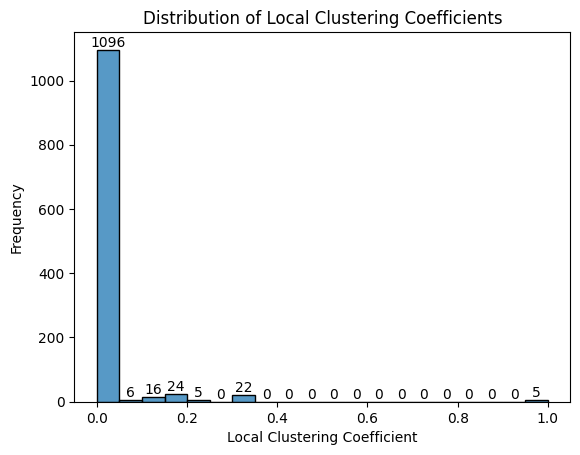

In [ ]:
#Create a line chart for the distribution of local clustering coefficients
coefficients = list(local_clustering_coefficient.values())
coefficients.sort()
unique_coefficients = list(set(coefficients))
counts = [coefficients.count(coeff) for coeff in unique_coefficients]

#Create a histogram for the distribution of local clustering coefficients
sns.histplot(list(local_clustering_coefficient.values()), bins=20, kde=False)
plt.xlabel('Local Clustering Coefficient')
plt.ylabel('Frequency')
plt.title('Distribution of Local Clustering Coefficients')

#Display the frequency count on top of each bin
for p in plt.gca().patches:
    plt.gca().annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='bottom', color='black', fontsize=10)

plt.show()

**Global Clustering Coefficient**

In [ ]:
# Calculate Global Clustering Coefficient
global_clustering_coefficient = nx.transitivity(G)

# Print Global Clustering Coefficient
print("Global Clustering Coefficient:", global_clustering_coefficient)

Global Clustering Coefficient: 0.0338863395693611


**Betweenness Centrality**

In [ ]:
# Calculate Betweenness Centrality

#normalized: If True, the betweenness centrality scores are normalized by dividing by the maximum possible betweenness centrality.
#            Normalization is useful for comparing centrality scores across graphs of different sizes.

#endpoints: If False, only considers paths between nodes as they are internal to the node set.
#           If True, considers both endpoints of the paths as adjacent to other nodes outside the node set.
#           Setting endpoints to False is often appropriate when analyzing networks where nodes represent entities that cannot pass through each other.

bet_centrality = nx.betweenness_centrality(G, normalized = True,endpoints = False)

# Print each node and its Betweenness Centrality
for node, centrality in bet_centrality.items():
    if centrality != 0:
        print(f"Node {node}: Betweenness Centrality = {centrality}")

Node Glasgow: Betweenness Centrality = 0.00012074870013296905
Node Preston: Betweenness Centrality = 3.927969763361644e-05
Node Edinburgh: Betweenness Centrality = 0.00023567818580169864
Node Birmingham: Betweenness Centrality = 7.419498441905327e-05
Node Cambridge: Betweenness Centrality = 8.728821696359208e-05
Node Le Havre: Betweenness Centrality = 0.0012802781391577389
Node Paris: Betweenness Centrality = 0.1442936246776904
Node Amiens: Betweenness Centrality = 4.368856081450899e-05
Node Orléans: Betweenness Centrality = 0.09618860714288163
Node Calais: Betweenness Centrality = 0.00784968237521389
Node Lyon: Betweenness Centrality = 0.023160608413251613
Node Brussels: Betweenness Centrality = 0.03921830073821375
Node Le Mans: Betweenness Centrality = 0.17511179543874308
Node Reims: Betweenness Centrality = 0.0286750349562477
Node Chaumont: Betweenness Centrality = 0.03223583185878485
Node Bordeaux: Betweenness Centrality = 0.011993629018181668
Node Tours: Betweenness Centrality = 0

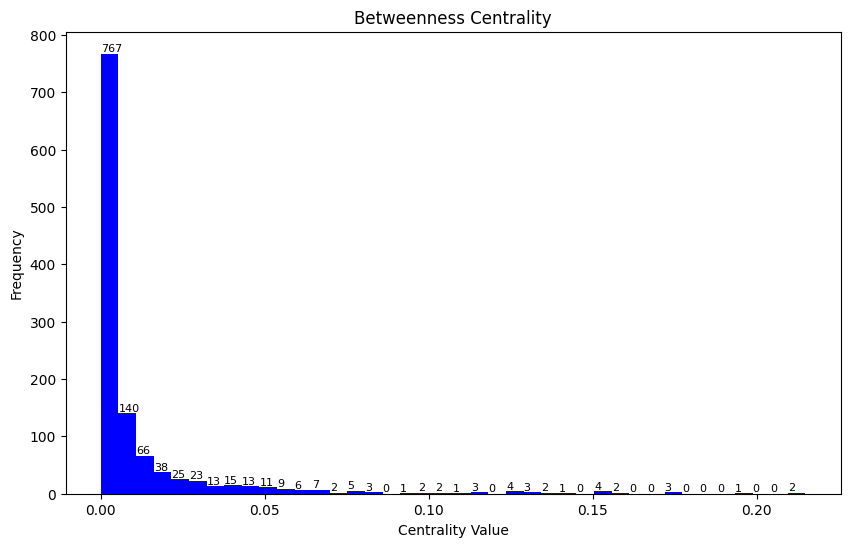

In [ ]:
# Plot distribution of centrality values for Betweenness Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Betweenness Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(bet_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Closeness centrality**

In [ ]:
def closeness_centrality(G, node):
    distances = nx.shortest_path_length(G, node)
    total_distance = sum(distances.values())
    return 1 / total_distance
# Calculate Closeness centrality
close_centrality = nx.closeness_centrality(G)

# Print each node and its Closeness centrality
for node, centrality in close_centrality.items():
    print(f"Node {node}: Closeness centrality = {centrality}")

Node Greenock: Closeness centrality = 0.004904508139649415
Node Glasgow: Closeness centrality = 0.005752483846037398
Node Preston: Closeness centrality = 0.0051507595943598465
Node Edinburgh: Closeness centrality = 0.006513394407682557
Node Birmingham: Closeness centrality = 0.0050869072026942285
Node Southampton: Closeness centrality = 0.004412299437462378
Node Cambridge: Closeness centrality = 0.005520320820861001
Node Le Havre: Closeness centrality = 0.0645266655707044
Node Paris: Closeness centrality = 0.06947035882612139
Node Amiens: Closeness centrality = 0.060677571964524835
Node Orléans: Closeness centrality = 0.06639707130251388
Node Calais: Closeness centrality = 0.06471305371276434
Node Lyon: Closeness centrality = 0.06576480879207969
Node Brussels: Closeness centrality = 0.06596790321739278
Node Le Mans: Closeness centrality = 0.07138149552370042
Node Reims: Closeness centrality = 0.06546949995716159
Node Chaumont: Closeness centrality = 0.0658260774257544
Node Bordeaux: Cl

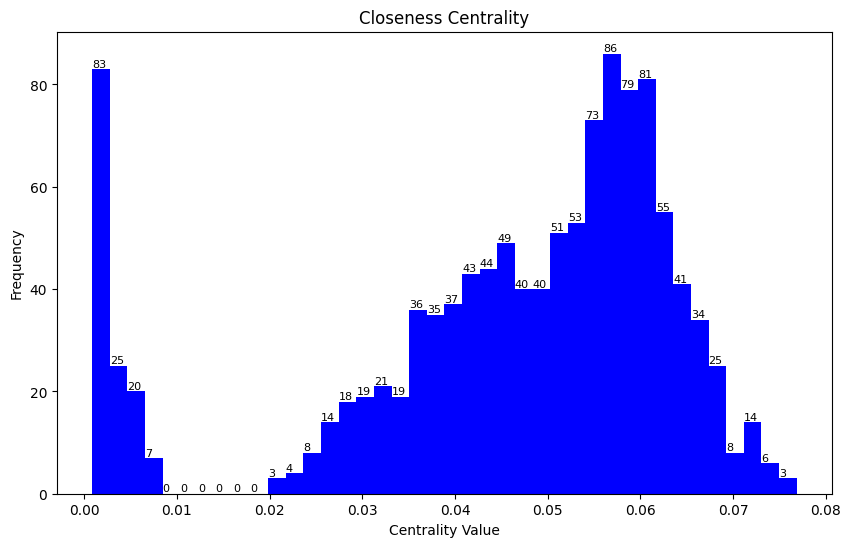

In [ ]:
# Plot distribution of centrality values for Closeness Centrality
plt.figure(figsize=(10, 6))
plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)  # Increase bin size to 40
plt.title("Closeness Centrality")
plt.xlabel('Centrality Value')
plt.ylabel('Frequency')

# Write frequency on top of each bin
for i in range(40):
    plt.text(plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)[1][i],
             plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)[0][i],
             str(int(plt.hist(list(close_centrality.values()), bins=40, color='b', alpha=0.7)[0][i])),
             fontsize=8, ha='left', va='bottom')

plt.show()

**Reciprocity**

In [ ]:
reciprocity = nx.reciprocity(G)
print("Reciprocity:", reciprocity)

Reciprocity: 0.0


**Transitivity**

In [ ]:
transitivity = nx.transitivity(G)
print("Transitivity:", transitivity)

Transitivity: 0.0338863395693611


**Top 10 for each Centrality Measure**

In [ ]:
# Create dataframes for centrality measures
df_degree = pd.DataFrame(list(deg_centrality.items()), columns=['Node', 'Degree Centrality']).nlargest(10, 'Degree Centrality')
df_eigenvector = pd.DataFrame(list(eigenvector_centrality.items()), columns=['Node', 'Eigenvector Centrality']).nlargest(10, 'Eigenvector Centrality')
df_katz = pd.DataFrame(list(katz_centrality.items()), columns=['Node', 'Katz Centrality']).nlargest(10, 'Katz Centrality')
df_pagerank = pd.DataFrame(list(pr.items()), columns=['Node', 'PageRank Centrality']).nlargest(10, 'PageRank Centrality')
df_betweenness = pd.DataFrame(list(bet_centrality.items()), columns=['Node', 'Betweenness Centrality']).nlargest(10, 'Betweenness Centrality')
df_closeness = pd.DataFrame(list(close_centrality.items()), columns=['Node', 'Closeness Centrality']).nlargest(10, 'Closeness Centrality')

In [ ]:
# Print outputs
print("\nTop 10 nodes by Degree Centrality:")
print(df_degree.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Eigenvector Centrality:")
print(df_eigenvector.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Katz Centrality:")
print(df_katz.to_string(index=False, justify='center'))

print("\nTop 10 nodes by PageRank Centrality:")
print(df_pagerank.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Betweenness Centrality:")
print(df_betweenness.to_string(index=False, justify='center'))

print("\nTop 10 nodes by Closeness Centrality:")
print(df_closeness.to_string(index=False, justify='center'))


Top 10 nodes by Degree Centrality:
   Node     Degree Centrality
    Moscow      0.008525     
     Paris      0.006820     
     Liège      0.006820     
    Berlin      0.006820     
    Munich      0.006820     
  Budapest      0.006820     
      Metz      0.005968     
    Prague      0.005968     
    Vienna      0.005968     
Bratislava      0.005968     

Top 10 nodes by Eigenvector Centrality:
        Node          Eigenvector Centrality
               Paris         0.365117       
                Metz         0.300224       
               Reims         0.280757       
            Brussels         0.236252       
               Liège         0.205969       
             Le Mans         0.204101       
             Orléans         0.201639       
          Luxembourg         0.190521       
Charleville-Mézières         0.187324       
                Lyon         0.176082       

Top 10 nodes by Katz Centrality:
   Node     Katz Centrality
    Moscow     0.052258    
     Par

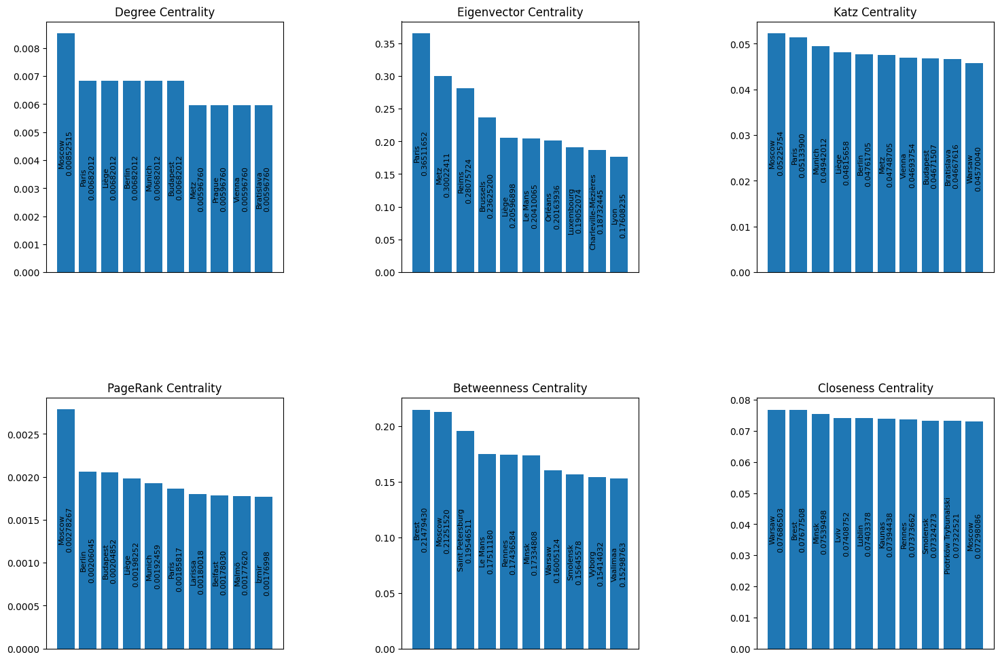

In [ ]:
# Visualize centrality measures
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
bars = plt.bar(df_degree['Node'], df_degree['Degree Centrality'])
plt.title('Degree Centrality')
for bar, city, value in zip(bars, df_degree['Node'], df_degree['Degree Centrality']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height()/2, f'{city}\n{value:.8f}', ha='center', va='center', rotation=90, fontsize=8)
plt.xticks([])

plt.subplot(2, 3, 2)
bars = plt.bar(df_eigenvector['Node'], df_eigenvector['Eigenvector Centrality'])
plt.title('Eigenvector Centrality')
for bar, city, value in zip(bars, df_eigenvector['Node'], df_eigenvector['Eigenvector Centrality']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height()/2, f'{city}\n{value:.8f}', ha='center', va='center', rotation=90, fontsize=8)
plt.xticks([])

plt.subplot(2, 3, 3)
bars = plt.bar(df_katz['Node'], df_katz['Katz Centrality'])
plt.title('Katz Centrality')
for bar, city, value in zip(bars, df_katz['Node'], df_katz['Katz Centrality']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height()/2, f'{city}\n{value:.8f}', ha='center', va='center', rotation=90, fontsize=8)
plt.xticks([])

plt.subplot(2, 3, 4)
bars = plt.bar(df_pagerank['Node'], df_pagerank['PageRank Centrality'])
plt.title('PageRank Centrality')
for bar, city, value in zip(bars, df_pagerank['Node'], df_pagerank['PageRank Centrality']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height()/2, f'{city}\n{value:.8f}', ha='center', va='center', rotation=90, fontsize=8)
plt.xticks([])

plt.subplot(2, 3, 5)
bars = plt.bar(df_betweenness['Node'], df_betweenness['Betweenness Centrality'])
plt.title('Betweenness Centrality')
for bar, city, value in zip(bars, df_betweenness['Node'], df_betweenness['Betweenness Centrality']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height()/2, f"{city}\n{value:.8f}", ha='center', va='center', rotation=90, fontsize=8)
plt.xticks([])  # Hide x-axis points

plt.subplot(2, 3, 6)
bars = plt.bar(df_closeness['Node'], df_closeness['Closeness Centrality'])
plt.title('Closeness Centrality')
for bar, city, value in zip(bars, df_closeness['Node'], df_closeness['Closeness Centrality']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height()/2, f'{city}\n{value:.8f}', ha='center', va='center', rotation=90, fontsize=8)
plt.xticks([])

plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()

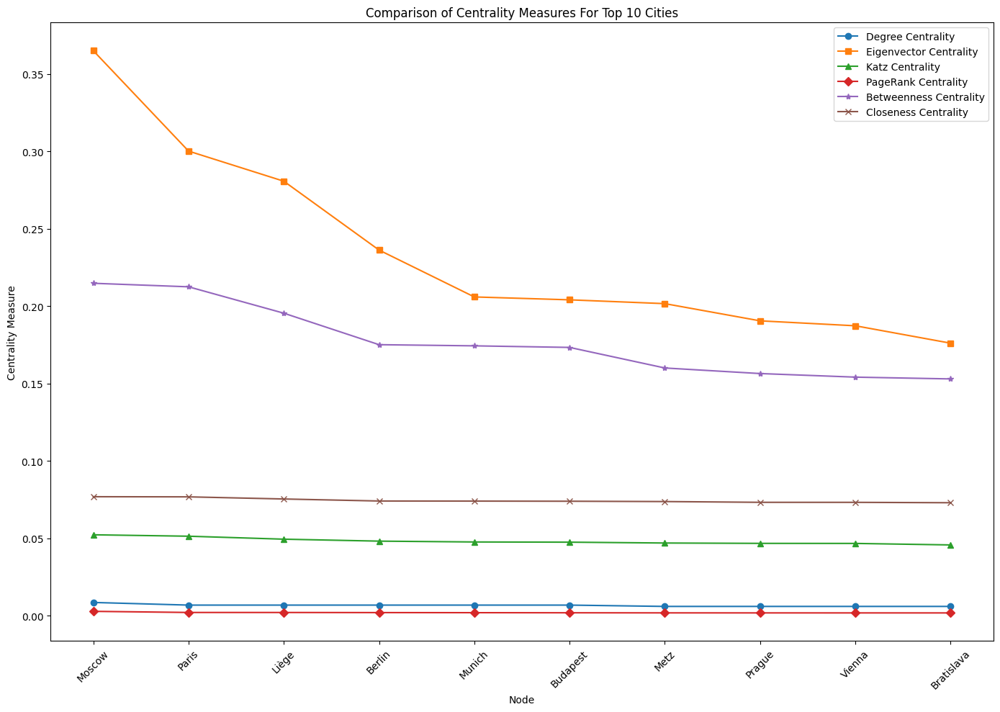

In [ ]:
# Data for centrality measures
nodes = df_degree['Node']
degree_centrality = df_degree['Degree Centrality']
eigenvector_centrality = df_eigenvector['Eigenvector Centrality']
katz_centrality = df_katz['Katz Centrality']
pagerank_centrality = df_pagerank['PageRank Centrality']
betweenness_centrality = df_betweenness['Betweenness Centrality']
closeness_centrality = df_closeness['Closeness Centrality']

# Plotting
plt.figure(figsize=(14, 10))

plt.plot(nodes, degree_centrality, marker='o', label='Degree Centrality')
plt.plot(nodes, eigenvector_centrality, marker='s', label='Eigenvector Centrality')
plt.plot(nodes, katz_centrality, marker='^', label='Katz Centrality')
plt.plot(nodes, pagerank_centrality, marker='D', label='PageRank Centrality')
plt.plot(nodes, betweenness_centrality, marker='*', label='Betweenness Centrality')
plt.plot(nodes, closeness_centrality, marker='x', label='Closeness Centrality')

# Adding labels and title
plt.xlabel('Node')
plt.ylabel('Centrality Measure')
plt.title('Comparison of Centrality Measures For Top 10 Cities')
plt.xticks(rotation=45)
plt.legend()

# Display plot
plt.tight_layout()
plt.show()


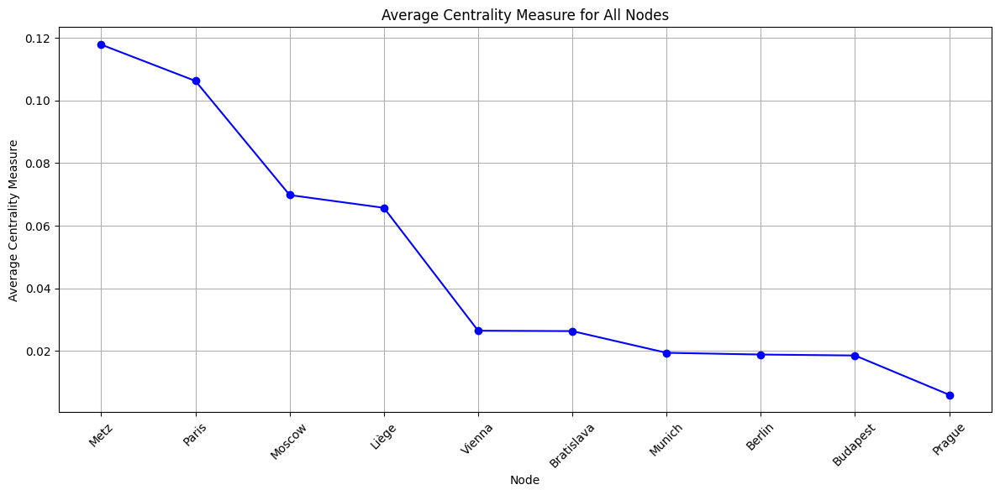

In [ ]:
# Calculate average centrality measure for each node
average_centrality = {}
for node in nodes:
    total_centrality = 0
    count = 0
    for df, centrality in [
        (df_degree, degree_centrality),
        (df_eigenvector, eigenvector_centrality),
        (df_katz, katz_centrality),
        (df_pagerank, pagerank_centrality),
        (df_betweenness, betweenness_centrality),
        (df_closeness, closeness_centrality)
    ]:
        if node in df['Node'].values:
            total_centrality += centrality[df['Node'] == node].values[0]
            count += 1
    average_centrality[node] = total_centrality / count if count > 0 else 0

# Sort the nodes based on average centrality
sorted_nodes = sorted(average_centrality.keys(), key=lambda x: average_centrality[x], reverse=True)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(sorted_nodes, [average_centrality[node] for node in sorted_nodes], marker='o', linestyle='-', color='b')

# Adding labels and title
plt.xlabel('Node')
plt.ylabel('Average Centrality Measure')
plt.title('Average Centrality Measure for All Nodes')
plt.xticks(rotation=45)
plt.grid(True)

# Display plot
plt.tight_layout()
plt.show()

# Bridge Node: It could be a node that serves as a bridge between different parts of the network, connecting otherwise disconnected components.

# Influential Node: The node may have a high influence on other nodes in the network, affecting information flow, decisions, or interactions.

# Central Node: It could be a central node in the network, meaning that many shortest paths between other nodes pass through it.

# Hub Node: The node might act as a hub, connecting to many other nodes in the network.

# Critical Node: Its removal could significantly impact the network's structure or function, indicating its critical role in maintaining the network's integrity.

# Highly Connected Node: The node likely has a high degree of connectivity, being connected to many other nodes in the network.


**Visulize Centrality Measure**

<ipython-input-224-e655bb13c89c>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eigenvector_centrality[node] = 0
<ipython-input-224-e655bb13c89c>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  katz_centrality[node] = 0


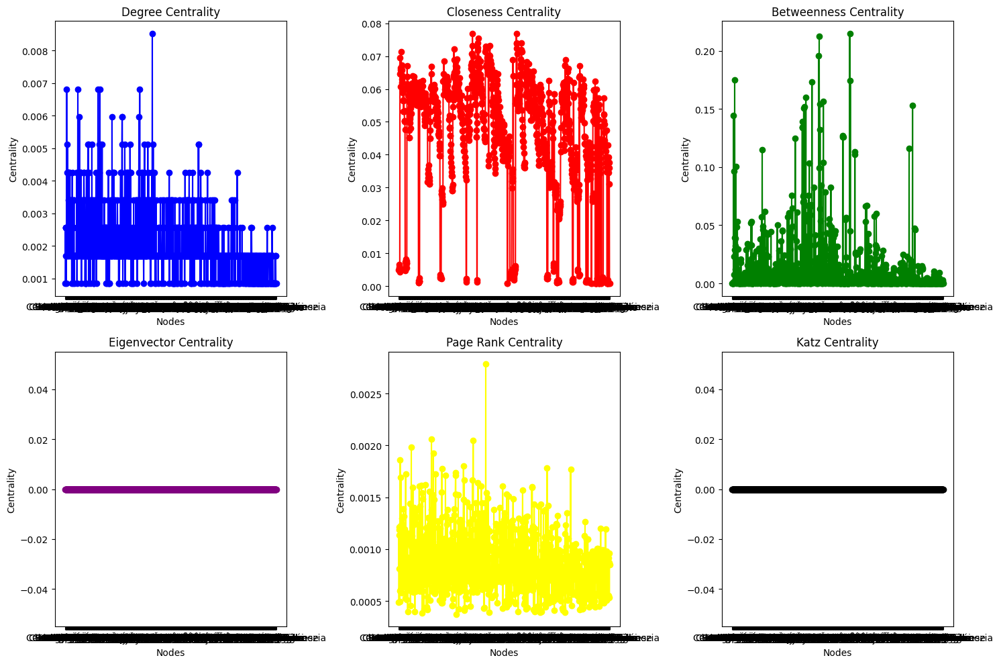

In [ ]:
# Ensure all nodes are included in the centrality dictionaries
for node in G.nodes():
    if node not in deg_centrality:
        deg_centrality[node] = 0
    if node not in close_centrality:
        close_centrality[node] = 0
    if node not in bet_centrality:
        bet_centrality[node] = 0
    if node not in eigenvector_centrality:
        eigenvector_centrality[node] = 0
    if node not in pr:
        pr[node] = 0
    if node not in katz_centrality:
        katz_centrality[node] = 0

#Convert centrality measures to lists for plotting
nodes = list(G.nodes())
degree_values = [deg_centrality[node] for node in nodes]
closeness_values = [close_centrality[node] for node in nodes]
betweenness_values = [bet_centrality[node] for node in nodes]
eigenvector_values = [eigenvector_centrality[node] for node in nodes]
page_rank = [pr[node] for node in nodes]
katz_values = [katz_centrality[node] for node in nodes]

#Plot centrality measures
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.plot(nodes, degree_values, marker='o', linestyle='-', color='b')
plt.title('Degree Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 2)
plt.plot(nodes, closeness_values, marker='o', linestyle='-', color='r')
plt.title('Closeness Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 3)
plt.plot(nodes, betweenness_values, marker='o', linestyle='-', color='g')
plt.title('Betweenness Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 4)
plt.plot(nodes, eigenvector_values, marker='o', linestyle='-', color='purple')
plt.title('Eigenvector Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 5)
plt.plot(nodes, page_rank, marker='o', linestyle='-', color='yellow')
plt.title('Page Rank Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.subplot(2, 3, 6)
plt.plot(nodes, katz_values, marker='o', linestyle='-', color='black')
plt.title('Katz Centrality')
plt.xlabel('Nodes')
plt.ylabel('Centrality')

plt.tight_layout()
plt.show()

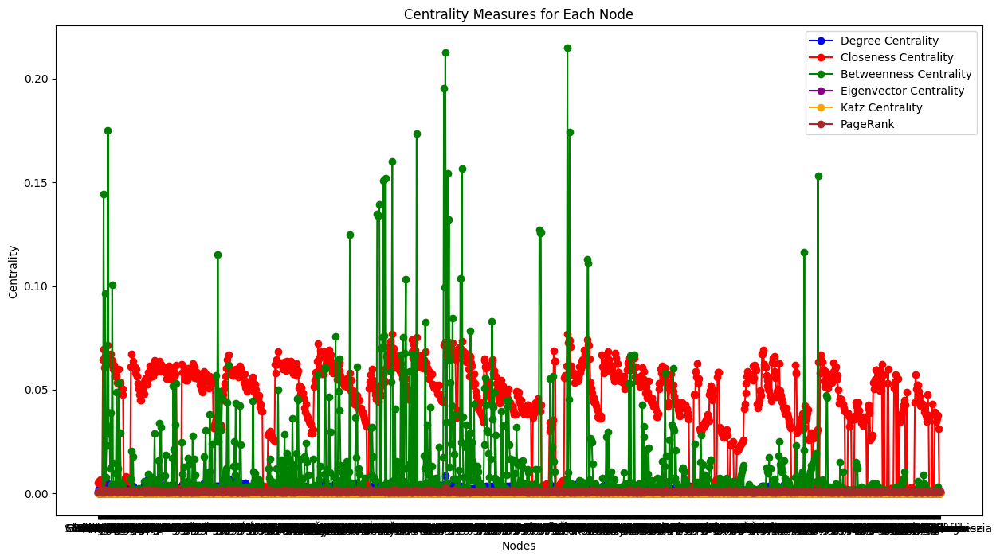

In [ ]:
# Plot centrality measures
plt.figure(figsize=(15, 8))

plt.plot(nodes, degree_values, marker='o', linestyle='-', color='b', label='Degree Centrality')
plt.plot(nodes, closeness_values, marker='o', linestyle='-', color='r', label='Closeness Centrality')
plt.plot(nodes, betweenness_values, marker='o', linestyle='-', color='g', label='Betweenness Centrality')
plt.plot(nodes, eigenvector_values, marker='o', linestyle='-', color='purple', label='Eigenvector Centrality')
plt.plot(nodes, katz_values, marker='o', linestyle='-', color='orange', label='Katz Centrality')
plt.plot(nodes, page_rank, marker='o', linestyle='-', color='brown', label='PageRank')

plt.title('Centrality Measures for Each Node')
plt.xlabel('Nodes')
plt.ylabel('Centrality')
plt.legend()
plt.grid(False)
plt.show()

**Correlation Matrix**

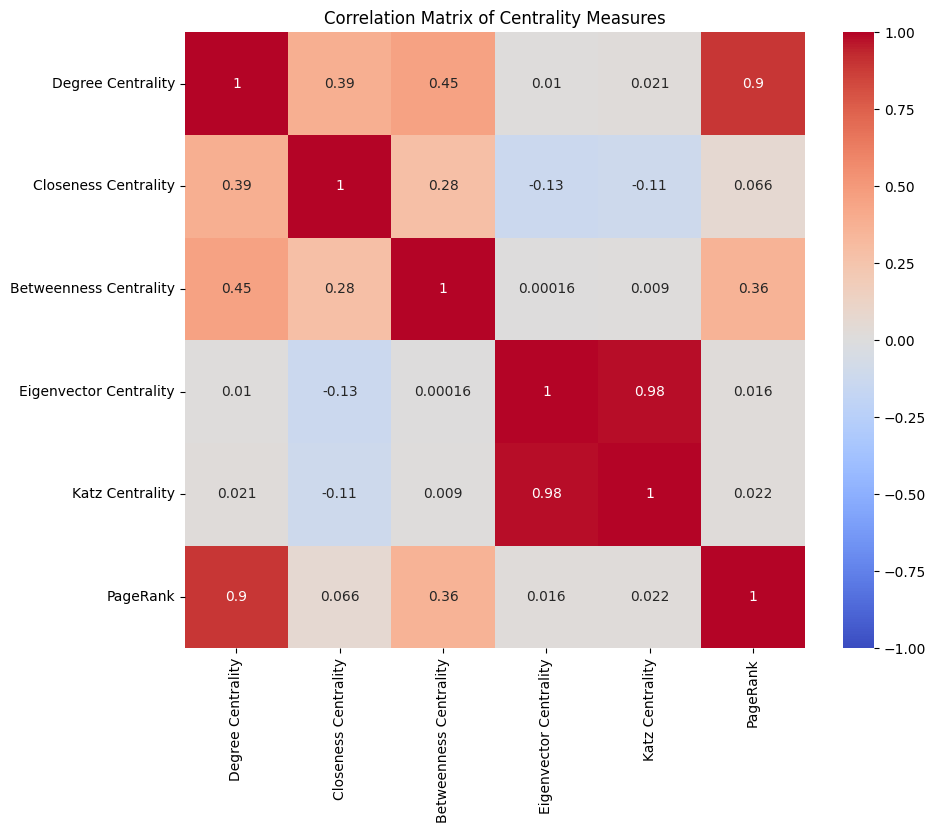

In [ ]:
# Ensure all centrality dictionaries have the same length
min_length = min(len(deg_centrality), len(close_centrality), len(bet_centrality), len(eigenvector_centrality), len(katz_centrality), len(pr))

# Create a DataFrame from the centrality measures
data = {
    "Degree Centrality": list(deg_centrality.values())[:min_length],
    "Closeness Centrality": list(close_centrality.values())[:min_length],
    "Betweenness Centrality": list(bet_centrality.values())[:min_length],
    "Eigenvector Centrality": list(eigenvector_centrality.values)[:min_length],
    "Katz Centrality": list(katz_centrality.values)[:min_length],
    "PageRank": list(pr.values())[:min_length]
}
df = pd.DataFrame(data)

# Calculate correlation matrix
correlation_matrix = df.corr()

# Plot correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Matrix of Centrality Measures")
plt.show()

In [ ]:
#Compare centrality measures based on criteria

mean_degree = sum(deg_centrality.values()) / len(deg_centrality)
mean_closeness = sum(close_centrality.values()) / len(close_centrality)
mean_betweenness = sum(bet_centrality.values()) / len(bet_centrality)
mean_eigenvector = sum(eigenvector_centrality.values) / len(eigenvector_centrality)
mean_katz = sum(katz_centrality.values) / len(katz_centrality)
mean_pagerank = sum(pr.values()) / len(pr)

print("Mean Degree Centrality:", mean_degree)
print("Mean Closeness Centrality:", mean_closeness)
print("Mean Betweenness Centrality:", mean_betweenness)
print("Mean Eigenvector Centrality:", mean_eigenvector)
print("Mean Katz Centrality:", mean_katz)
print("Mean PageRank:", mean_pagerank)

Mean Degree Centrality: 0.002057944872638308
Mean Closeness Centrality: 0.04566886623059432
Mean Betweenness Centrality: 0.011629407659036898
Mean Eigenvector Centrality: 0.001983096629615323
Mean Katz Centrality: 0.00040735347883730824
Mean PageRank: 0.0008517887563884154


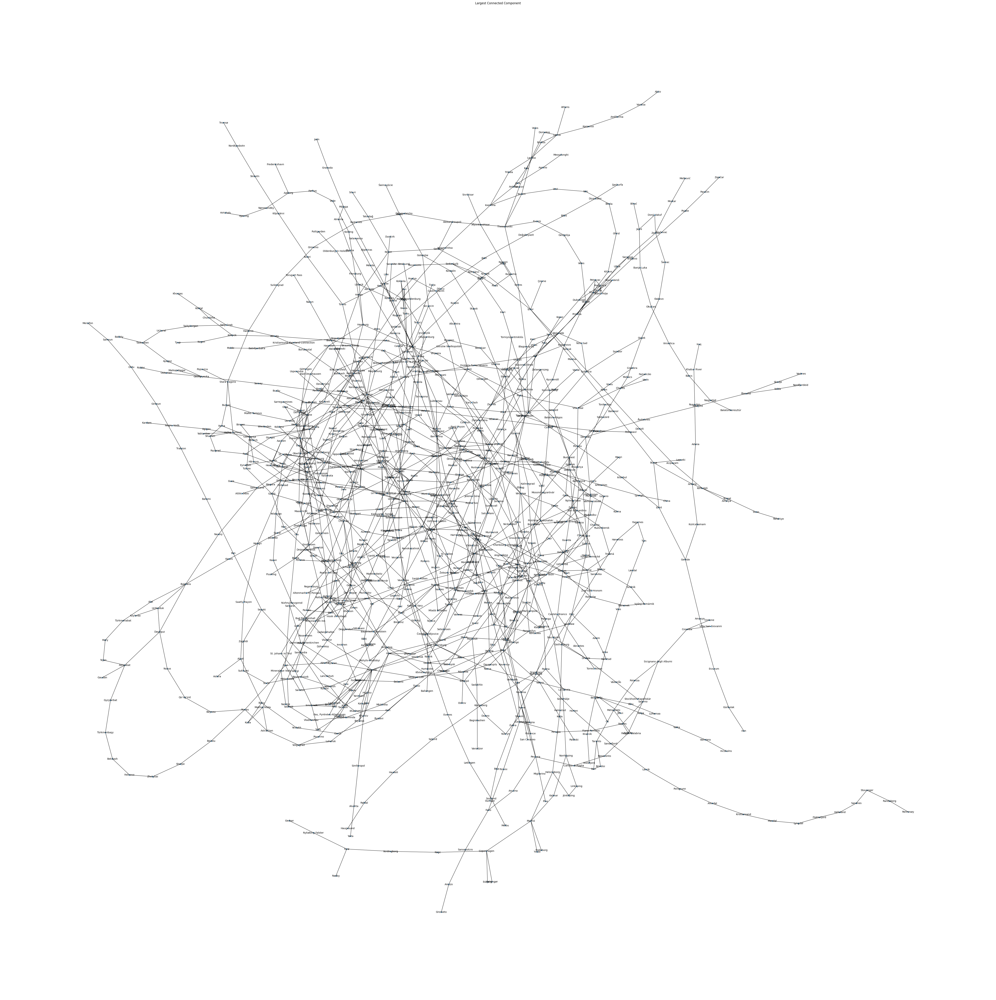

Number of nodes in the largest connected component: 1039
Number of edges in the largest connected component: 1305


In [ ]:
# Find the largest connected component
largest_component = max(nx.connected_components(G), key=len)

# Create a subgraph of the largest connected component
largest_component_subgraph = G.subgraph(largest_component)

# Visualize the largest connected component
plt.figure(figsize=(56, 56))
nx.draw(largest_component_subgraph, with_labels=True, node_size = 10, font_size = 10)
plt.title('Largest Connected Component')
plt.show()

# Print the number of nodes and edges in the largest connected component
print("Number of nodes in the largest connected component:", largest_component_subgraph.number_of_nodes())
print("Number of edges in the largest connected component:", largest_component_subgraph.number_of_edges())

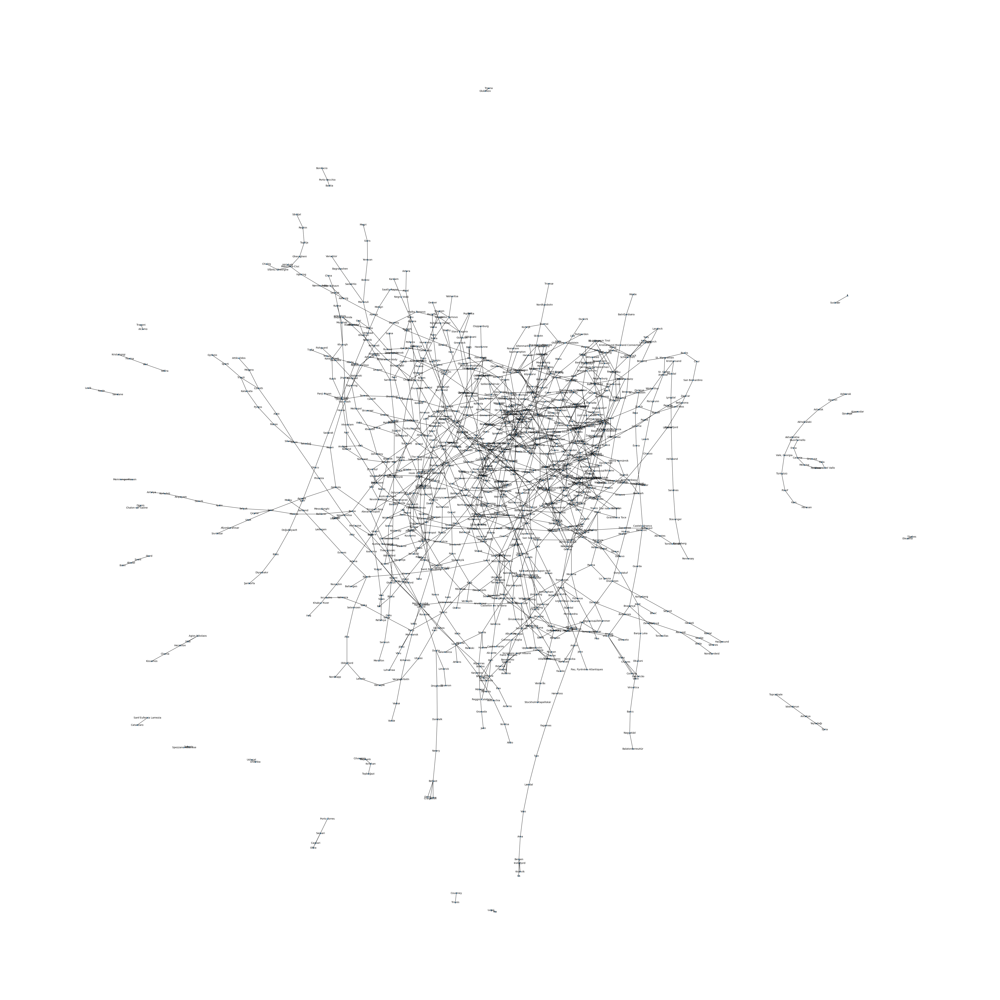

In [ ]:
plt.figure(figsize=(56, 56))
nx.draw(G, with_labels=True, node_size = 10, font_size = 10)